# Large-trader position structure — factor exploration

Visualise the 大額交易人未沖銷部位結構 data on daily MXF to see which slices carry directional information:

1. Raw counts over time (positioning growth)
2. Concentration — how dominated is OI by the top 5/10
3. Net-position metrics — bullish/bearish tilts (`top10_net_pct`)
4. All-traders vs institutional-only subset (trader_type 0 vs 1)
5. Cross-product comparison — TX vs TE vs TF
6. Signal transforms ready for the factor-zoo pipeline
7. Preview one candidate on `cta.Simulate`

## PIT
TAIFEX publishes this at ~15:00 after 13:45 close. `cta.Simulate` uses `signal.shift(2)` so signal[D] drives PnL from D+1→D+2 — 22+ h buffer before return starts. Safe with default `pit_lag_days=0` on daily bars.

In [27]:
import importlib, sys, warnings
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

warnings.filterwarnings("ignore", message="findfont: .* not found")
_inst = {f.name for f in fm.fontManager.ttflist}
_cand = ["Hiragino Sans GB","Heiti TC","Songti SC","PingFang SC","PingFang TC",
         "Arial Unicode MS","Noto Sans CJK TC","DejaVu Sans"]
mpl.rcParams["font.family"] = [f for f in _cand if f in _inst] or ["DejaVu Sans"]
mpl.rcParams["axes.unicode_minus"] = False

import cta
for _m in ["cta.large_trader","cta.simulate","cta.signal_stats"]:
    if _m in sys.modules: importlib.reload(sys.modules[_m])
importlib.reload(cta)

IN_SAMPLE_START = "2013-01-01"
IN_SAMPLE_END   = "2024-12-31"
OOS_START       = "2025-01-01"
OOS_END         = "2026-06-26"

ASSET = cta.load_asset("mtx", "1d")
cta.set_active_asset(ASSET)
cta.set_date_range(start_date=IN_SAMPLE_START, end_date=OOS_END)

PLOT_START = "2013-01-01"       # for time-series plots — skip the early sparse years
print(f"asset: {ASSET.symbol} {ASSET.time_granularity} {len(ASSET):,} bars   ({ASSET.index.min().date()} → {ASSET.index.max().date()})")
print(f"IS:  {IN_SAMPLE_START} → {IN_SAMPLE_END}")
print(f"OOS: {OOS_START} → {OOS_END}")

ImportError: cannot import name 'EventFFill' from 'cta.operators' (/Users/hsureggie/coding/Research/mtx/cta/operators.py)

## Data availability sanity check

How many years of data per product? Which products have both trader-type breakdowns?

In [2]:
cat = cta.show_large_trader_catalog()

488 commodities in the CSV
commodity                  name  n_rows first_date  last_date
       TX 臺股期貨(TX+MTX/4+TMF/20)   23620 2008-12-17 2026-07-24
       TE        電子期貨(TE+ZEF/8)   17276 2008-12-17 2026-07-24
       TF        金融期貨(TF+ZFF/4)   17276 2008-12-17 2026-07-24
      XIF                 非金電期貨   17276 2008-12-17 2026-07-24
      TGF                臺幣黃金期貨   17276 2008-12-17 2026-07-24
      GTF                  櫃買期貨   17276 2008-12-17 2026-07-24
      GDF                  黃金期貨   17276 2008-12-17 2026-07-24
       DE                 永豐金期貨   16168 2010-01-25 2026-07-24
       DC                  彰銀期貨   16168 2010-01-25 2026-07-24
       CS                  華新期貨   16168 2010-01-25 2026-07-24
       CZ                  長榮期貨   16168 2010-01-25 2026-07-24
       DQ                  群創期貨   16168 2010-01-25 2026-07-24
       DF                  台泥期貨   16168 2010-01-25 2026-07-24
       DG                  台化期貨   16168 2010-01-25 2026-07-24
       DH                  鴻海期貨   16168 201

## 1. Positioning growth — raw counts over time

`total_oi` on TX (the TAIEX-consolidated aggregate) shows how much overall open interest has grown since 2008. `top10_buy` and `top10_sell` should scale with it — if they don't, the concentration structure is shifting.

**Key metric to watch: `top10_concentration`** — the share of OI held by the top 10 on both sides. Elevated concentration = fewer, bigger players; low = broad-based positioning.

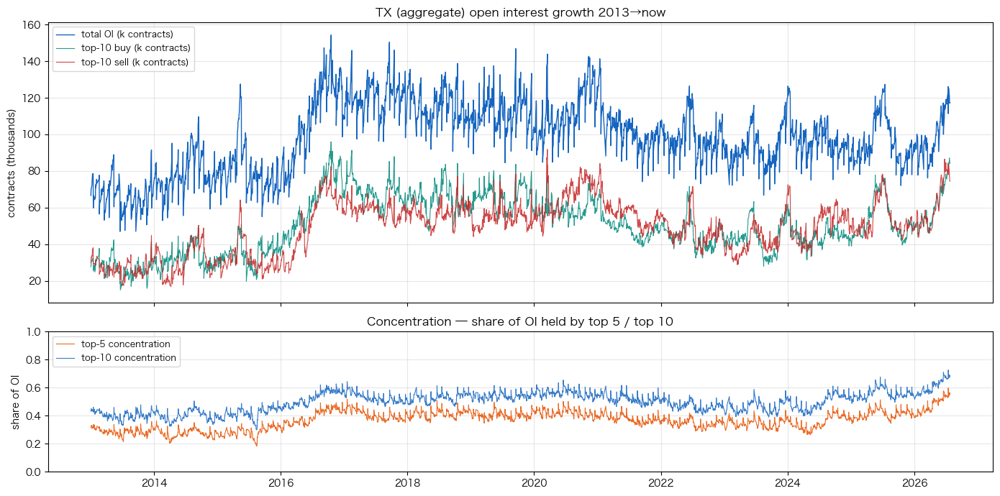


top-5 concentration  mean 0.37   most recent 0.55
top-10 concentration mean 0.50   most recent 0.68


In [3]:
tx_total_oi = cta.load_large_trader("TXF", "total_oi").loc[PLOT_START:]
tx_top10_buy = cta.load_large_trader("TXF", "top10_buy").loc[PLOT_START:]
tx_top10_sell = cta.load_large_trader("TXF", "top10_sell").loc[PLOT_START:]
tx_top5_conc  = cta.load_large_trader("TXF", "top5_concentration").loc[PLOT_START:]
tx_top10_conc = cta.load_large_trader("TXF", "top10_concentration").loc[PLOT_START:]

fig, axes = plt.subplots(2, 1, figsize=(14, 7), sharex=True,
                         gridspec_kw={"height_ratios":[2,1]})

ax = axes[0]
ax.plot(tx_total_oi.index, tx_total_oi.values/1000, color="#1565c0", lw=1.0,
        label="total OI (k contracts)")
ax.plot(tx_top10_buy.index, tx_top10_buy.values/1000, color="#00897b", lw=0.8, alpha=0.85,
        label="top-10 buy (k contracts)")
ax.plot(tx_top10_sell.index, tx_top10_sell.values/1000, color="#c62828", lw=0.8, alpha=0.85,
        label="top-10 sell (k contracts)")
ax.set_ylabel("contracts (thousands)"); ax.legend(loc="upper left", fontsize=9)
ax.set_title("TX (aggregate) open interest growth 2013→now")
ax.grid(alpha=0.3)

ax = axes[1]
ax.plot(tx_top5_conc.index,  tx_top5_conc.values,  color="#e65100", lw=0.8,
        label="top-5 concentration", alpha=0.85)
ax.plot(tx_top10_conc.index, tx_top10_conc.values, color="#1565c0", lw=0.8,
        label="top-10 concentration", alpha=0.85)
ax.set_ylabel("share of OI"); ax.legend(loc="upper left", fontsize=9)
ax.set_title("Concentration — share of OI held by top 5 / top 10")
ax.grid(alpha=0.3); ax.set_ylim(0, 1.0)

plt.tight_layout(); plt.show()

print(f"\ntop-5 concentration  mean {tx_top5_conc.mean():.2f}   most recent {tx_top5_conc.iloc[-1]:.2f}")
print(f"top-10 concentration mean {tx_top10_conc.mean():.2f}   most recent {tx_top10_conc.iloc[-1]:.2f}")

## 2. Net-position tilt — bullish/bearish signal

`top10_net_pct = (buy − sell) / total_oi` — positive = top 10 traders net long, negative = net short. This is the classic "where is smart money leaning" indicator.

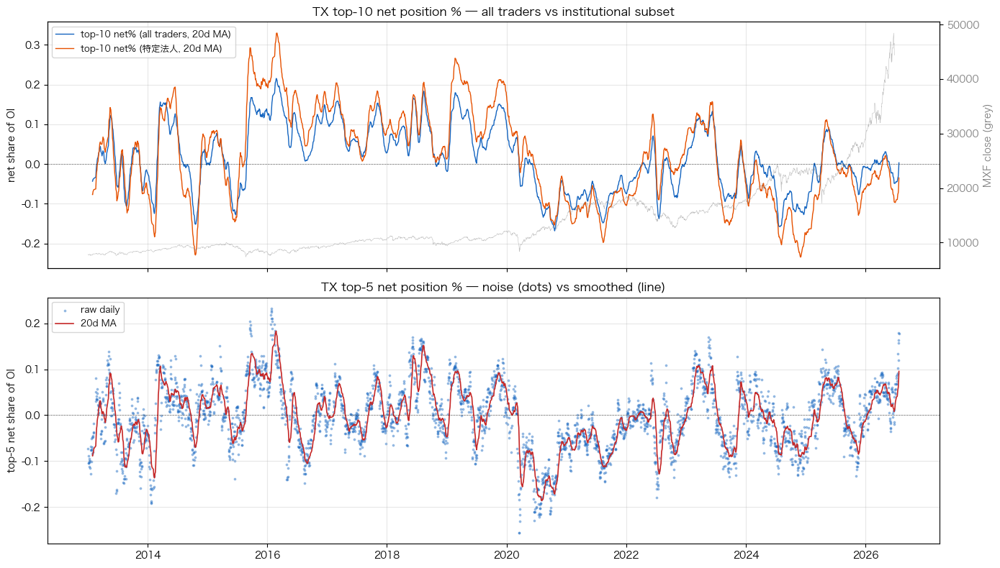


top-10 net% (all)   mean +0.014   stdev 0.091
top-10 net% (inst)  mean +0.021   stdev 0.124
correlation between all-net and inst-net: +0.930


In [4]:
tx_net_all  = cta.load_large_trader("TXF", "top10_net_pct").loc[PLOT_START:]
tx_net_inst = cta.load_large_trader("TXF", "top10_net_pct", trader_type="special").loc[PLOT_START:]
tx_net5_all = cta.load_large_trader("TXF", "top5_net_pct").loc[PLOT_START:]

# Overlay with the underlying price (MXF close) as a semi-transparent second axis
px = ASSET["close"].loc[PLOT_START:]

fig, axes = plt.subplots(2, 1, figsize=(14, 8), sharex=True)

ax = axes[0]; ax2 = ax.twinx()
ax.plot(tx_net_all.index,  tx_net_all.rolling(20).mean(), color="#1565c0", lw=1.0,
        label="top-10 net% (all traders, 20d MA)")
ax.plot(tx_net_inst.index, tx_net_inst.rolling(20).mean(), color="#e65100", lw=1.0,
        label="top-10 net% (特定法人, 20d MA)")
ax.axhline(0, color="black", lw=0.5, ls="--", alpha=0.5)
ax.set_ylabel("net share of OI"); ax.legend(loc="upper left", fontsize=9)
ax.set_title("TX top-10 net position % — all traders vs institutional subset")
ax.grid(alpha=0.3)
ax2.plot(px.index, px.values, color="grey", lw=0.4, alpha=0.5)
ax2.set_ylabel("MXF close (grey)", color="grey"); ax2.tick_params(axis="y", labelcolor="grey")

ax = axes[1]
ax.scatter(tx_net5_all.index, tx_net5_all.values, s=3, alpha=0.35, color="#1565c0",
           label="raw daily")
ax.plot(tx_net5_all.index, tx_net5_all.rolling(20).mean(), color="#c62828", lw=1.2,
        label="20d MA")
ax.axhline(0, color="black", lw=0.5, ls="--", alpha=0.5)
ax.set_ylabel("top-5 net share of OI"); ax.legend(loc="upper left", fontsize=9)
ax.set_title("TX top-5 net position % — noise (dots) vs smoothed (line)")
ax.grid(alpha=0.3)

plt.tight_layout(); plt.show()

print(f"\ntop-10 net% (all)   mean {tx_net_all.mean():+.3f}   stdev {tx_net_all.std():.3f}")
print(f"top-10 net% (inst)  mean {tx_net_inst.mean():+.3f}   stdev {tx_net_inst.std():.3f}")
print(f"correlation between all-net and inst-net: {tx_net_all.corr(tx_net_inst):+.3f}")

## 3. Distribution shape — histograms of net-position signals

Wide, symmetric distributions with tails suggest the signal has room to differentiate. Narrow / tight histograms mean the metric barely moves.

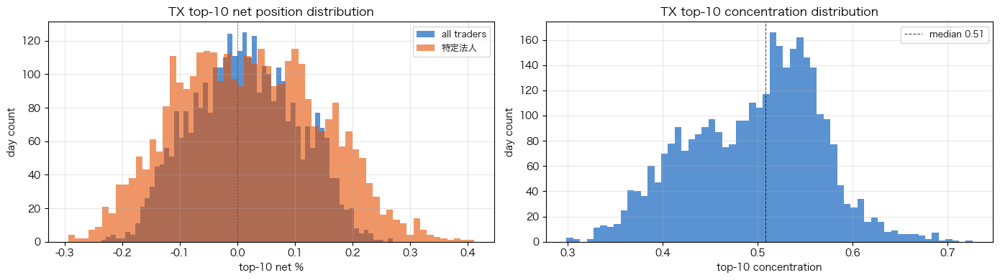

  top-10 net% (all)         mean +0.014  stdev 0.091  skew +0.03  kurt -0.63
  top-10 net% (inst)        mean +0.021  stdev 0.124  skew +0.12  kurt -0.57
  top-10 concentration      mean +0.497  stdev 0.069  skew -0.18  kurt -0.38


In [5]:
fig, axes = plt.subplots(1, 2, figsize=(14, 4))

ax = axes[0]
ax.hist(tx_net_all.dropna(), bins=60, alpha=0.7, color="#1565c0", label="all traders")
ax.hist(tx_net_inst.dropna(), bins=60, alpha=0.6, color="#e65100", label="特定法人")
ax.axvline(0, color="black", lw=0.6, ls="--", alpha=0.5)
ax.set_xlabel("top-10 net %"); ax.set_ylabel("day count")
ax.set_title("TX top-10 net position distribution"); ax.legend(fontsize=9)
ax.grid(alpha=0.3)

ax = axes[1]
ax.hist(tx_top10_conc.dropna(), bins=60, alpha=0.7, color="#1565c0")
ax.axvline(tx_top10_conc.median(), color="black", lw=0.8, ls="--", alpha=0.7,
           label=f"median {tx_top10_conc.median():.2f}")
ax.set_xlabel("top-10 concentration"); ax.set_ylabel("day count")
ax.set_title("TX top-10 concentration distribution"); ax.legend(fontsize=9)
ax.grid(alpha=0.3)

plt.tight_layout(); plt.show()

for name, s in [("top-10 net% (all)", tx_net_all),
                ("top-10 net% (inst)", tx_net_inst),
                ("top-10 concentration", tx_top10_conc)]:
    d = s.dropna()
    print(f"  {name:24s}  mean {d.mean():+.3f}  stdev {d.std():.3f}  "
          f"skew {d.skew():+.2f}  kurt {d.kurt():+.2f}")

## 4. Cross-product comparison — TX vs TE vs TF

Different sectors might show different institutional dynamics. TX = TAIEX weighted. TE = Electronics (dominated by TSMC). TF = Financials.

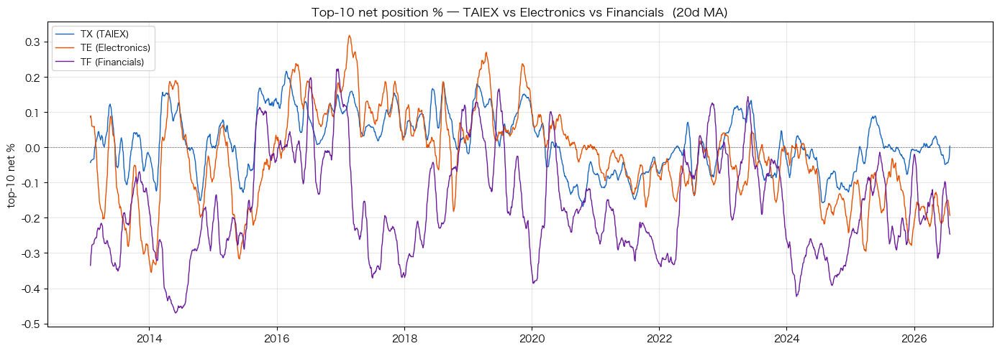


=== Correlation matrix (daily) ===
       TX     TE     TF
TX  1.000  0.581  0.274
TE  0.581  1.000  0.157
TF  0.274  0.157  1.000


In [6]:
tx = cta.load_large_trader("TXF", "top10_net_pct").loc[PLOT_START:]
te = cta.load_large_trader("TE",  "top10_net_pct").loc[PLOT_START:]
tf = cta.load_large_trader("TF",  "top10_net_pct").loc[PLOT_START:]

fig, ax = plt.subplots(figsize=(14, 5))
for name, s, color in [("TX (TAIEX)", tx, "#1565c0"),
                       ("TE (Electronics)", te, "#e65100"),
                       ("TF (Financials)", tf, "#6a1b9a")]:
    ax.plot(s.index, s.rolling(20).mean(), lw=1.0, color=color, label=name)
ax.axhline(0, color="black", lw=0.5, ls="--", alpha=0.5)
ax.set_ylabel("top-10 net %")
ax.set_title("Top-10 net position % — TAIEX vs Electronics vs Financials  (20d MA)")
ax.legend(loc="upper left", fontsize=9); ax.grid(alpha=0.3)
plt.tight_layout(); plt.show()

j = pd.concat([tx.rename("TX"), te.rename("TE"), tf.rename("TF")], axis=1).dropna()
print("\n=== Correlation matrix (daily) ===")
print(j.corr().round(3))

## 5. Concentration vs future returns — scatterplot exploration

Naïve visual test: does the top-10 net% today predict tomorrow's MXF return? Colour-code by year to check for regime shifts.

/var/folders/ph/6k474nt57bsbh53k8tc674dr0000gn/T/ipykernel_728/1238642237.py:2: Pandas4Warning: Sorting by default when concatenating all DatetimeIndex is deprecated.  In the future, pandas will respect the default of `sort=False`. Specify `sort=True` or `sort=False` to silence this message. If you see this warnings when not directly calling concat, report a bug to pandas.
  j = pd.concat([tx_net_all.rename("top10_net_pct"), ret_next.rename("ret_next")], axis=1).dropna()


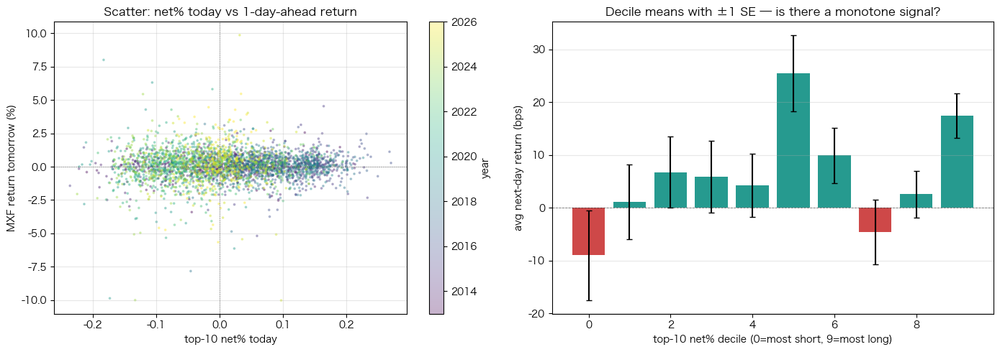


Decile means (bps):
        mean_bps  se_bps  count
bucket                         
0          -8.99    8.53    329
1           1.10    7.03    329
2           6.75    6.75    329
3           5.90    6.78    329
4           4.19    5.97    329
5          25.42    7.24    328
6           9.90    5.23    329
7          -4.56    6.09    329
8           2.59    4.43    329
9          17.44    4.20    329


In [7]:
ret_next = ASSET["close"].pct_change().shift(-1)     # tomorrow's return
j = pd.concat([tx_net_all.rename("top10_net_pct"), ret_next.rename("ret_next")], axis=1).dropna()
j["year"] = j.index.year

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

ax = axes[0]
sc = ax.scatter(j["top10_net_pct"], j["ret_next"]*100, s=3, alpha=0.3,
                c=j["year"], cmap="viridis")
ax.axhline(0, color="black", lw=0.4, ls="--", alpha=0.5)
ax.axvline(0, color="black", lw=0.4, ls="--", alpha=0.5)
ax.set_xlabel("top-10 net% today"); ax.set_ylabel("MXF return tomorrow (%)")
ax.set_title("Scatter: net% today vs 1-day-ahead return")
plt.colorbar(sc, ax=ax, label="year")
ax.grid(alpha=0.3)

ax = axes[1]
# Bucket the signal into deciles and show avg next-day return per bucket
j["bucket"] = pd.qcut(j["top10_net_pct"], q=10, labels=False)
b = j.groupby("bucket")["ret_next"].agg(["mean","std","count"])
b["mean_bps"] = b["mean"] * 1e4
b["se_bps"]   = b["std"] / np.sqrt(b["count"]) * 1e4
ax.bar(b.index, b["mean_bps"], yerr=b["se_bps"],
       color=["#c62828" if v<0 else "#00897b" for v in b["mean_bps"]], alpha=0.85,
       capsize=3)
ax.axhline(0, color="black", lw=0.6, ls="--", alpha=0.5)
ax.set_xlabel("top-10 net% decile (0=most short, 9=most long)")
ax.set_ylabel("avg next-day return (bps)")
ax.set_title("Decile means with ±1 SE — is there a monotone signal?")
ax.grid(alpha=0.3, axis="y")

plt.tight_layout(); plt.show()

print("\nDecile means (bps):")
print(b[["mean_bps","se_bps","count"]].round(2).to_string())

## 6. Signal transforms — normalized versions ready for the factor zoo

Same convention as the three-majors / options notebooks:
* **rank240** — `2 × (InstRank(240, x) − 0.5)`, ~1-year rolling percentile, centered
* **dev60_240** — deviation from 240d mean, z-scored on 60d window
* **xtreme240** — `+1` top decile, `−1` bottom decile, `0` else
* **chgskew60** — skew of 60d changes

All are drift-neutral by construction, safe to feed into `cta.Simulate` with `normalize=False`.

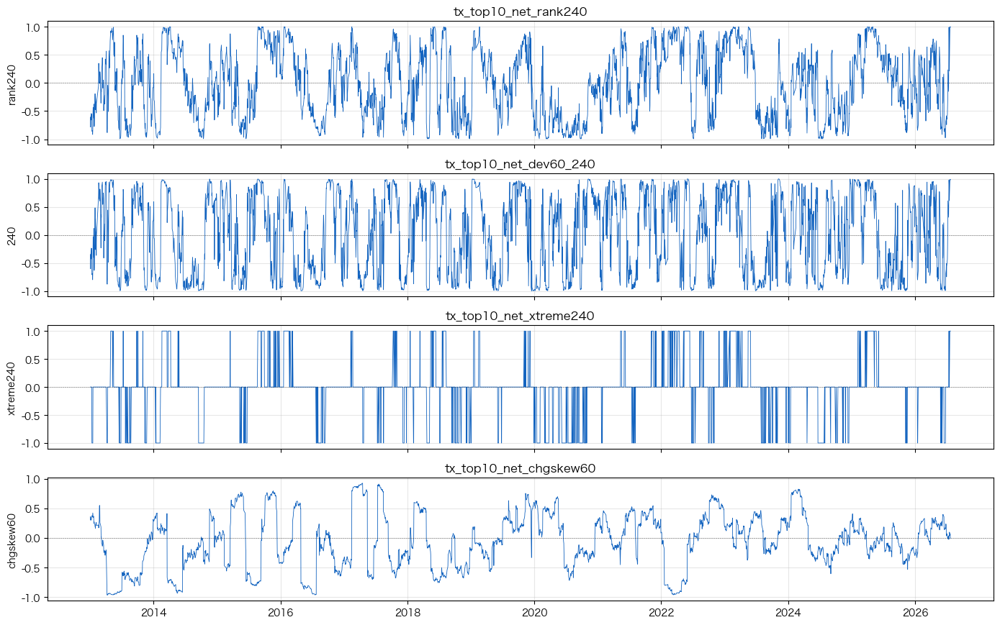

In [8]:
def _bounded(s): return np.tanh(s.replace([np.inf,-np.inf], np.nan))
def _z(s, w=60): return (s - s.rolling(w, min_periods=10).mean()) / s.rolling(w, min_periods=10).std()
def _rank_c(s, w): return (cta.InstRank(w, s) - 0.5) * 2
def _dev_z(s, ws, wl):
    dev = s - cta.InstMean(wl, s)
    return _bounded(_z(dev, ws))
def _xtreme(s, w, hi=0.90, lo=0.10):
    rk = cta.InstRank(w, s)
    return pd.Series(np.where(rk>hi, 1.0, np.where(rk<lo, -1.0, 0.0)), index=s.index)

# Build transforms for TX top-10 net%
base = cta.load_large_trader("TXF", "top10_net_pct").astype(float)
signals = {
    "tx_top10_net_rank240":    _rank_c(base, 240),
    "tx_top10_net_dev60_240":  _dev_z(base, 60, 240),
    "tx_top10_net_xtreme240":  _xtreme(base, 240),
    "tx_top10_net_chgskew60":  _bounded(cta.InstSkew(60, base.diff())),
}

fig, axes = plt.subplots(len(signals), 1, figsize=(14, 2.2*len(signals)), sharex=True)
for ax, (name, s) in zip(axes, signals.items()):
    ax.plot(s.loc[PLOT_START:].index, s.loc[PLOT_START:].values, lw=0.6, color="#1565c0")
    ax.axhline(0, color="black", lw=0.4, ls="--", alpha=0.5)
    ax.set_ylabel(name.split("_")[-1]); ax.set_title(name)
    ax.grid(alpha=0.3)
plt.tight_layout(); plt.show()

## 7. Preview — run one candidate through `cta.Simulate`

The `tx_top10_net_rank240` signal — long when top-10 net% is high in trailing-year rank, short when low. Full 5×3 dashboard shows alpha/beta, weekly/monthly seasonality, expiry CASR, etc.

IS+OOS stats for tx_top10_net_rank240:
  sign chosen: +1
  SR_gross   : +0.52
  SR_net     : +0.51
  beta       : -0.115
  alpha_ann_pct: +8.09%
  SR_of_SR   : +0.60


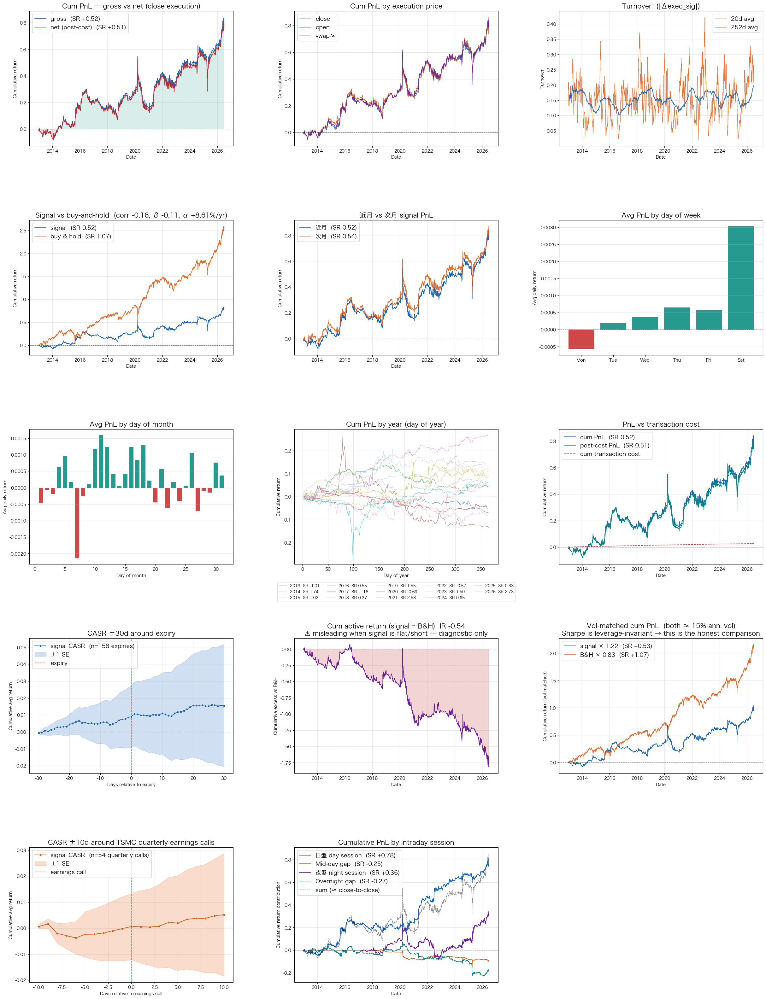

{'asset_obj': BaseAsset  MTX
   time_granularity : 1d
   bars             : 3,290
   start            : 2013-01-02
   end              : 2026-06-26
 
                open     high      low    close    volume  settlement       oi  \
 date                                                                            
 2013-01-02   7725.0   7804.0   7701.0   7775.0   52557.0      7773.0  20616.0   
 2013-01-03   7813.0   7835.0   7803.0   7825.0   34060.0      7824.0  20468.0   
 2013-01-04   7803.0   7809.0   7751.0   7775.0   40919.0      7775.0  19648.0   
 2013-01-07   7748.0   7775.0   7701.0   7742.0   47655.0      7741.0  20797.0   
 2013-01-08   7725.0   7747.0   7672.0   7710.0   55246.0      7709.0  21822.0   
 ...             ...      ...      ...      ...       ...         ...      ...   
 2026-06-22  47439.0  48467.0  47369.0  48445.0  124615.0     48428.0  32470.0   
 2026-06-23  48800.0  48866.0  47408.0  47440.0  165543.0     47437.0  32850.0   
 2026-06-24  46820.0  47060.0 

In [26]:
sig = signals["tx_top10_net_rank240"]

# Auto-flip sign via stats table so gross Sharpe >= 0
stats = cta.signal_stats(sig, ASSET, start=IN_SAMPLE_START, end=OOS_END)
print(f"IS+OOS stats for tx_top10_net_rank240:")
print(f"  sign chosen: {stats['sign']:+d}")
print(f"  SR_gross   : {stats['SR_gross']:+.2f}")
print(f"  SR_net     : {stats['SR_net']:+.2f}")
print(f"  beta       : {stats['beta']:+.3f}")
print(f"  alpha_ann_pct: {stats['alpha_ann_pct']:+.2f}%")
print(f"  SR_of_SR   : {stats['SR_of_SR']:+.2f}")

# Full dashboard
cta.set_date_range(start_date=IN_SAMPLE_START, end_date=OOS_END)
cta.Simulate(sig * int(stats["sign"]), time_granularity="1d", normalize=False)

## 8. Compare 3 candidates side-by-side via `SimulateAll`

Rank240, dev60_240, and xtreme240 all fed into one grid so you can eyeball which construction fits the data best.

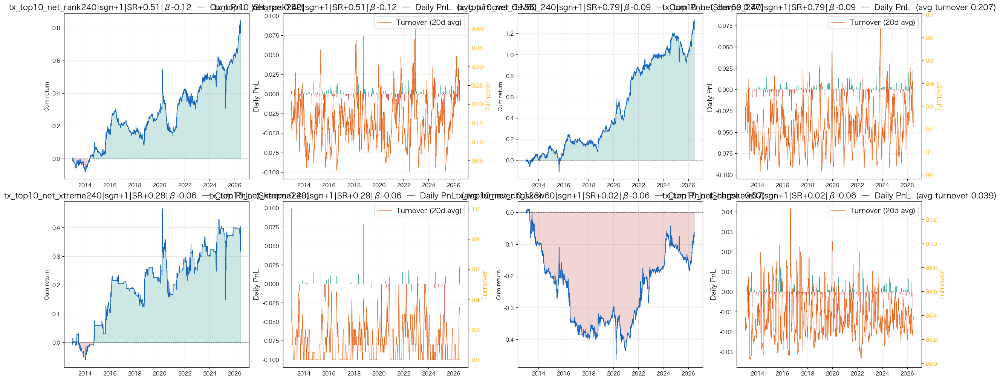

In [10]:
sigs_flipped = []
names_flipped = []
for name, s in signals.items():
    st = cta.signal_stats(s, ASSET, start=IN_SAMPLE_START, end=OOS_END)
    if st is None or st.get("note") == "insufficient_data": continue
    sig_sign = st["sign"]
    sigs_flipped.append(s * int(sig_sign))
    names_flipped.append(f"{name}|sgn{int(sig_sign):+d}|SR{st['SR_net']:+.2f}|β{st['beta']:+.2f}")

cta.set_date_range(start_date=IN_SAMPLE_START, end_date=OOS_END)
cta.SimulateAll(*sigs_flipped, names=names_flipped,
                time_granularity="1d", normalize=False)
cta.set_date_range(start_date=IN_SAMPLE_START, end_date=IN_SAMPLE_END)

## 9. Self-normalized transforms — value vs its own recent history

Beyond the standard `_rank_c` / `_dev_z` transforms, try **direct arithmetic against a rolling mean of the same series**. Two families:

* **Deviation** — `value − InstMean(W, value)`. Already covered by `_dev_z` at (60, 240).
* **Ratio** — `value / InstMean(W, value)`. For sign-flippable series like `top10_net_pct` this is unstable near zero, so use it on strictly-positive series (`top10_concentration`, `total_oi`, `top10_gross`).
* **Self z-score** — `(value − InstMean(W, value)) / InstStdev(W, value)`. Robust to scale differences.

Windows swept: **20, 60, 240** — short (1 month), medium (3 months), long (1 year).

In [11]:
# Rebuild a small toolbox for readability
def _bounded(s): return np.tanh(s.replace([np.inf,-np.inf], np.nan))
def _self_dev(s, w):
    """value - InstMean(w, value) — absolute deviation from trailing mean."""
    return s - cta.InstMean(w, s)
def _self_zscore(s, w):
    """(value - InstMean(w, value)) / InstStdev(w, value) — self z-score."""
    mu = cta.InstMean(w, s)
    sd = cta.InstStdev(w, s).replace(0, np.nan)
    return (s - mu) / sd
def _self_ratio(s, w, floor=1e-6):
    """value / InstMean(w, value) — only meaningful for strictly-positive series."""
    mu = cta.InstMean(w, s).replace(0, np.nan)
    return s / mu.where(mu.abs() > floor)

self_norm_signals = {}

# Signed series (top10_net_pct) — use deviation & self z-score (ratio is unstable near zero)
net = cta.load_large_trader("TXF", "top10_net_pct").astype(float)
for W in [20, 60, 240]:
    self_norm_signals[f"tx_top10_net_dev{W}"]    = _bounded(_self_dev(net, W) * 10)
    self_norm_signals[f"tx_top10_net_selfz{W}"]  = _bounded(_self_zscore(net, W))

# Strictly-positive series — safe to ratio
conc  = cta.load_large_trader("TXF", "top10_concentration").astype(float)
gross = cta.load_large_trader("TXF", "top10_gross").astype(float)
oi    = cta.load_large_trader("TXF", "total_oi").astype(float)

for name, s in [("tx_conc", conc), ("tx_gross", gross), ("tx_oi", oi)]:
    for W in [20, 60, 240]:
        self_norm_signals[f"{name}_ratio{W}"] = _bounded((_self_ratio(s, W) - 1.0) * 5)
        self_norm_signals[f"{name}_selfz{W}"] = _bounded(_self_zscore(s, W))

print(f"self-normalized signals built: {len(self_norm_signals)}")

# Evaluate all
tbl_self = cta.batch_signal_stats(self_norm_signals, ASSET,
                                   start=IN_SAMPLE_START, end=OOS_END)
cols = ["sign","SR_gross","SR_net","beta","alpha_ann_pct","SR_of_SR","held_pct","turnover_ann"]
print("\n=== Self-normalized signals — sorted by SR_net ===")
display(tbl_self[cols].round(3))

self-normalized signals built: 24

=== Self-normalized signals — sorted by SR_net ===


,sign,SR_gross,SR_net,beta,alpha_ann_pct,SR_of_SR,held_pct,turnover_ann
signal,,,,,,,,
tx_top10_net_selfz20,1,0.868,0.840,-0.078,12.635,0.834,99.39,73.51
tx_top10_net_dev20,1,0.801,0.775,-0.051,7.115,0.923,98.27,39.35
tx_top10_net_selfz60,1,0.781,0.760,-0.110,11.874,0.808,99.30,53.19
tx_top10_net_dev60,1,0.677,0.657,-0.089,7.756,0.816,98.45,36.20
tx_oi_ratio20,-1,0.665,0.631,-0.034,4.610,0.580,97.99,40.63
tx_top10_net_selfz240,1,0.494,0.478,-0.127,8.313,0.558,99.27,40.32
tx_gross_ratio20,-1,0.490,0.465,-0.093,4.719,0.560,97.96,32.86
tx_oi_ratio60,-1,0.485,0.458,-0.057,4.407,0.465,98.33,38.82
tx_oi_selfz20,-1,0.473,0.439,-0.056,6.005,0.466,99.39,74.06


## 10. Cross-normalized — vs three-majors flow, vs MXF trading volume

Different normalization angle: instead of comparing the signal to its OWN history, compare it to a **contemporaneous denominator** from a different data source. Two useful denominators:

1. **MXF daily trading volume** (from `ASSET['volume']`). How big is the top-10's net position **relative to today's turnover**? A large net exposure vs small daily volume = "stuck", slow to unwind, more meaningful.
2. **Three-majors 外資 (foreign) net OI** (from `cta.load_three_majors`). Both metrics track institutional positioning; their **ratio** shows which institutional cohort is leading.
3. **Absolute change in own net-pct** — a "flow" version of the stock series.

These try to answer: *is today's top-10 positioning big/small relative to something with independent economic meaning?*

In [12]:
# Load the cross-reference series
mxf_vol = ASSET["volume"].astype(float)
three_maj_fi_oi = cta.load_three_majors("小型臺指期貨", "外資", "oi_net_lots").astype(float)

# Align all to ASSET index
net_signed = cta.load_large_trader("TXF", "top10_net_pct").astype(float).reindex(ASSET.index)
net_lots   = cta.load_large_trader("TXF", "top10_net").astype(float).reindex(ASSET.index)
conc       = cta.load_large_trader("TXF", "top10_concentration").astype(float).reindex(ASSET.index)
gross      = cta.load_large_trader("TXF", "top10_gross").astype(float).reindex(ASSET.index)
vol_ma20   = mxf_vol.rolling(20, min_periods=5).mean()
fi_oi      = three_maj_fi_oi.reindex(ASSET.index).astype(float)

cross_signals = {}

# --- Family A: top-10 net vs MXF volume ---
# High net position + low volume = "stuck" / conviction; low net + high vol = churn
for W in [20, 60]:
    ratio = net_lots.abs() / vol_ma20.replace(0, np.nan)
    cross_signals[f"tx_top10_net_over_vol_dev{W}"] = _bounded(
        (ratio - cta.InstMean(W, ratio)) / cta.InstStdev(W, ratio).replace(0, np.nan)
    )

# --- Family B: top-10 gross vs volume ---
for W in [20, 60]:
    ratio = gross / vol_ma20.replace(0, np.nan)
    cross_signals[f"tx_top10_gross_over_vol_selfz{W}"] = _bounded(
        (ratio - cta.InstMean(W, ratio)) / cta.InstStdev(W, ratio).replace(0, np.nan)
    )

# --- Family C: top-10 net vs 外資 net OI (from three-majors) ---
# When top-10 net moves faster than 外資 net → non-foreign large traders driving positioning
# Use difference to avoid unit issues
for W in [20, 60]:
    diff = net_lots - fi_oi        # both are "TX-equivalent contracts" scale (rough)
    cross_signals[f"tx_top10_minus_fi_dev{W}"] = _bounded(
        (diff - cta.InstMean(W, diff)) / cta.InstStdev(W, diff).replace(0, np.nan)
    )

# --- Family D: change in net-pct ("flow" version) ---
# 5-day and 20-day changes in top-10 net%
for N in [5, 20]:
    change = net_signed.diff(N)
    cross_signals[f"tx_top10_net_chg{N}_selfz"] = _bounded(
        (change - cta.InstMean(60, change)) / cta.InstStdev(60, change).replace(0, np.nan)
    )

print(f"cross-normalized signals built: {len(cross_signals)}")

# Evaluate all
tbl_cross = cta.batch_signal_stats(cross_signals, ASSET,
                                    start=IN_SAMPLE_START, end=OOS_END)
cols = ["sign","SR_gross","SR_net","beta","alpha_ann_pct","SR_of_SR","held_pct","turnover_ann"]
print("\n=== Cross-normalized signals — sorted by SR_net ===")
display(tbl_cross[cols].round(3))

cross-normalized signals built: 8

=== Cross-normalized signals — sorted by SR_net ===


,sign,SR_gross,SR_net,beta,alpha_ann_pct,SR_of_SR,held_pct,turnover_ann
signal,,,,,,,,
tx_top10_net_chg5_selfz,1,0.715,0.675,-0.041,8.507,0.473,99.30,89.37
tx_top10_minus_fi_dev60,1,0.680,0.660,0.162,5.543,0.698,99.86,92.12
tx_top10_net_chg20_selfz,1,0.572,0.549,-0.056,7.902,0.880,99.51,57.27
tx_top10_net_over_vol_dev60,-1,0.468,0.441,0.038,4.749,0.203,99.54,62.05
tx_top10_net_over_vol_dev20,-1,0.437,0.403,0.028,4.733,0.151,99.57,83.44
tx_top10_minus_fi_dev20,1,0.345,0.323,0.186,-1.042,0.361,99.03,109.80
tx_top10_gross_over_vol_selfz60,-1,0.157,0.146,0.195,-0.904,0.142,99.57,28.07
tx_top10_gross_over_vol_selfz20,-1,0.083,0.065,0.129,-1.044,0.070,99.60,47.36


## 11. Batch evaluate — everything together, ranked by composite score

Put all 4 original + 15 self-normalized + 8 cross-normalized signals through the same composite ranker used elsewhere in the codebase. The composite blends:

* **magnitude** — `min(|SR_IS|, |SR_OOS|)` (20%)
* **consistency** — `SR_net_oos / SR_net` clipped (45% — dominant weight)
* **stability** — `SR_of_SR` (15%)
* **alpha** — `alpha_ann_pct` (10%)
* **turnover** — negative rank of `turnover_ann` (10%)

Then filter to `|beta| ≤ 0.15` for market-neutral survivors.

In [13]:
# Original 4 + self-normalized 15 + cross-normalized 8 = 27 signals
ALL_SIGNALS = {**signals, **self_norm_signals, **cross_signals}
print(f"total signals: {len(ALL_SIGNALS)}")

# IS
tbl_is = cta.batch_signal_stats(ALL_SIGNALS, ASSET,
                                start=IN_SAMPLE_START, end=IN_SAMPLE_END)
# OOS with frozen IS sign
signed = {nm: ALL_SIGNALS[nm] * int(tbl_is.loc[nm, "sign"]) for nm in tbl_is.index}
tbl_oos = cta.batch_signal_stats(signed, ASSET, start=OOS_START, end=OOS_END,
                                  auto_flip=False)
tbl_oos = tbl_oos.rename(columns={c: f"{c}_oos" for c in tbl_oos.columns if c != "sign"}).drop(columns=["sign"], errors="ignore")
combined = tbl_is.join(tbl_oos, how="inner")
combined["oos_is_ratio"] = (combined["SR_net_oos"] / combined["SR_net"].clip(lower=0.05)).round(3)

scored = cta.composite_score(
    combined,
    weights={"consistency": 0.45, "magnitude": 0.20, "stability": 0.15,
             "alpha": 0.10, "turnover": 0.10},
)

BETA_MAX = 0.15
scored_bn = scored[scored["beta"].abs() <= BETA_MAX]

print(f"\ntotal scored: {len(scored)},  β-neutral (|β|≤{BETA_MAX}): {len(scored_bn)}")
show_cols = ["sign","SR_net","SR_net_oos","oos_is_ratio","beta",
             "SR_of_SR","alpha_ann_pct","held_pct","turnover_ann","composite_score"]
print("\n=== Top 15 low-beta signals by composite ===")
display(scored_bn[show_cols].head(15).round(3))

total signals: 36

total scored: 36,  β-neutral (|β|≤0.15): 27

=== Top 15 low-beta signals by composite ===


,sign,SR_net,SR_net_oos,oos_is_ratio,beta,SR_of_SR,alpha_ann_pct,held_pct,turnover_ann,composite_score
signal,,,,,,,,,,
tx_top10_net_selfz20,1,0.900,0.593,0.659,-0.122,0.903,12.734,99.39,72.33,0.753
tx_oi_ratio240,-1,0.368,0.373,1.014,-0.029,0.616,3.325,98.43,37.00,0.704
tx_top10_minus_fi_dev60,1,1.209,0.412,0.341,-0.006,1.462,14.640,99.71,102.54,0.690
tx_top10_net_chg20_selfz,1,0.608,0.324,0.533,-0.080,1.051,8.010,99.59,55.49,0.682
tx_conc_ratio60,1,0.154,0.560,3.636,0.067,0.090,0.078,97.95,29.35,0.654
tx_top10_net_over_vol_dev60,-1,0.205,1.711,8.346,0.033,0.046,1.941,99.59,58.75,0.615
tx_top10_net_over_vol_dev20,-1,0.200,1.549,7.745,0.047,-0.001,1.895,99.66,80.90,0.585
tx_conc_ratio240,1,0.074,0.710,9.595,0.090,-0.092,-0.507,97.72,28.21,0.573
tx_conc_selfz20,-1,0.103,0.331,3.214,-0.145,0.058,2.766,99.45,81.13,0.566


## 12. SimulateAll grid — top-10 low-beta composite signals

Compact side-by-side view spanning IS + OOS.

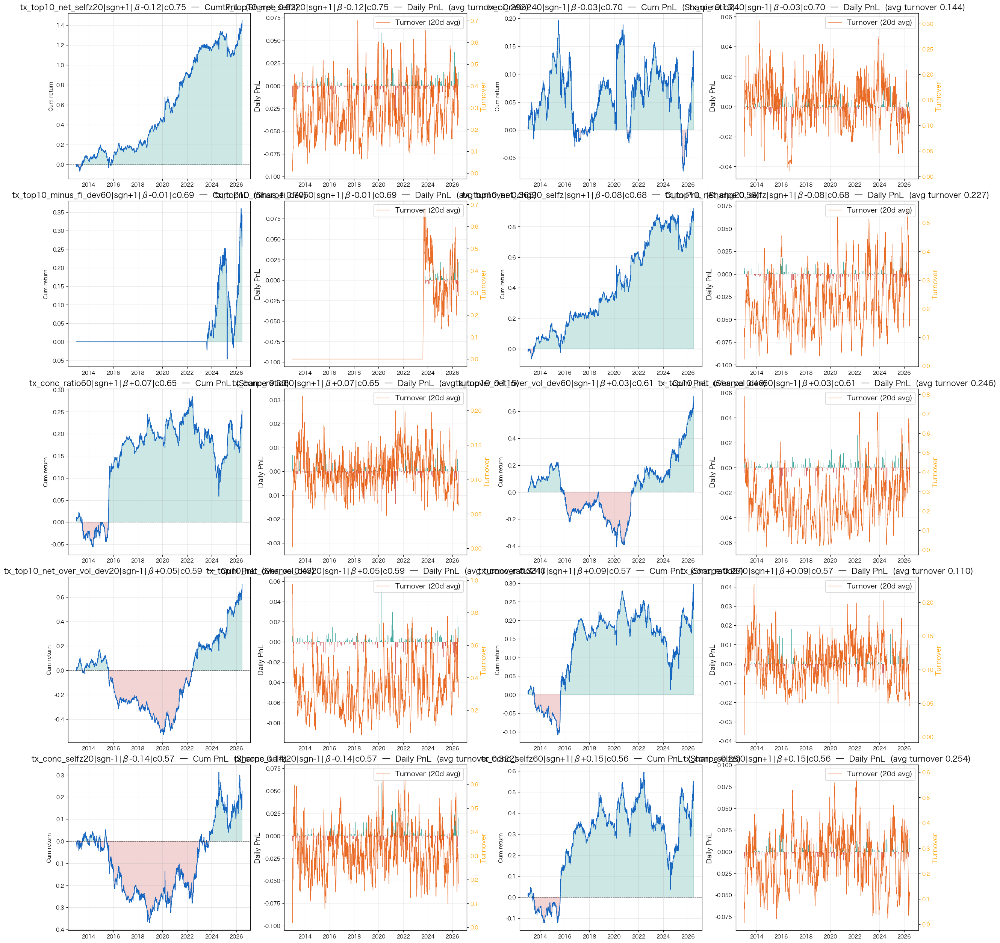

In [14]:
TOP_N = min(10, len(scored_bn))
sigs_top  = [ALL_SIGNALS[nm] * int(scored_bn.loc[nm, "sign"]) for nm in scored_bn.head(TOP_N).index]
names_top = [f"{nm}|sgn{int(scored_bn.loc[nm,'sign']):+d}|β{scored_bn.loc[nm,'beta']:+.2f}|c{scored_bn.loc[nm,'composite_score']:.2f}"
             for nm in scored_bn.head(TOP_N).index]

cta.set_date_range(start_date=IN_SAMPLE_START, end_date=OOS_END)
cta.SimulateAll(*sigs_top, names=names_top, time_granularity="1d", normalize=False)
cta.set_date_range(start_date=IN_SAMPLE_START, end_date=IN_SAMPLE_END)

## 13. Full dashboards on the top-3 by composite

Deep-dive on the winners — read alpha/beta, seasonality, drawdown pattern, expiry CASR.


=== tx_top10_net_selfz20   sign=+1   composite=0.753   IS SR_net=+0.90   OOS SR_net=+0.59   β=-0.122   α=+12.73% ===


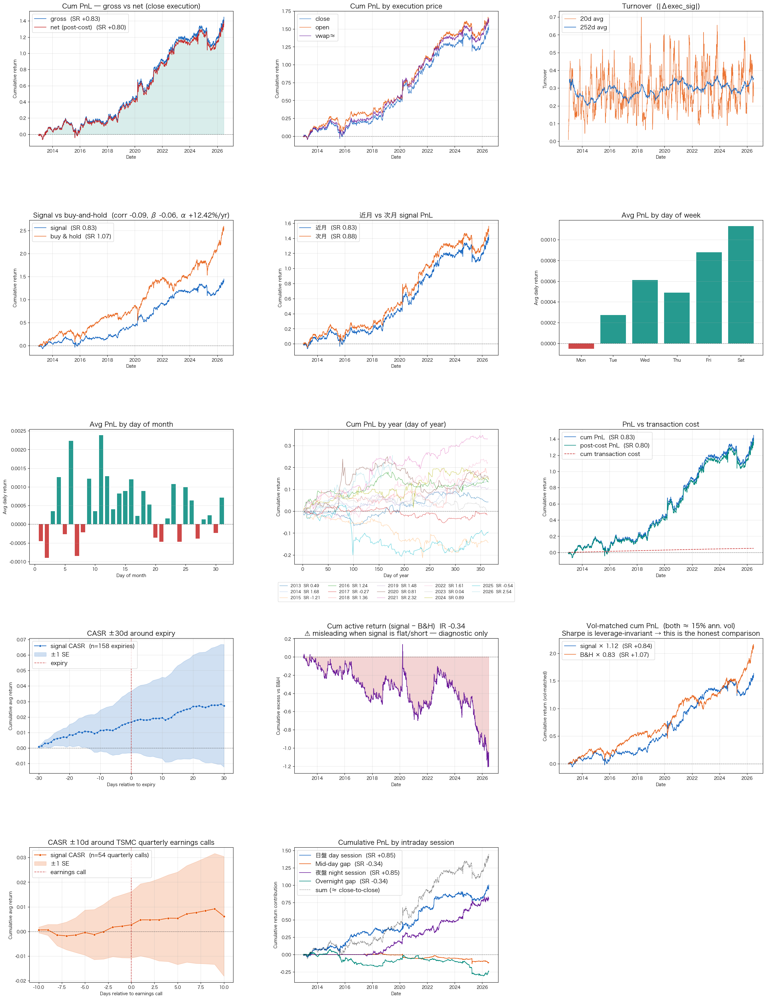


=== tx_oi_ratio240   sign=-1   composite=0.704   IS SR_net=+0.37   OOS SR_net=+0.37   β=-0.029   α=+3.33% ===


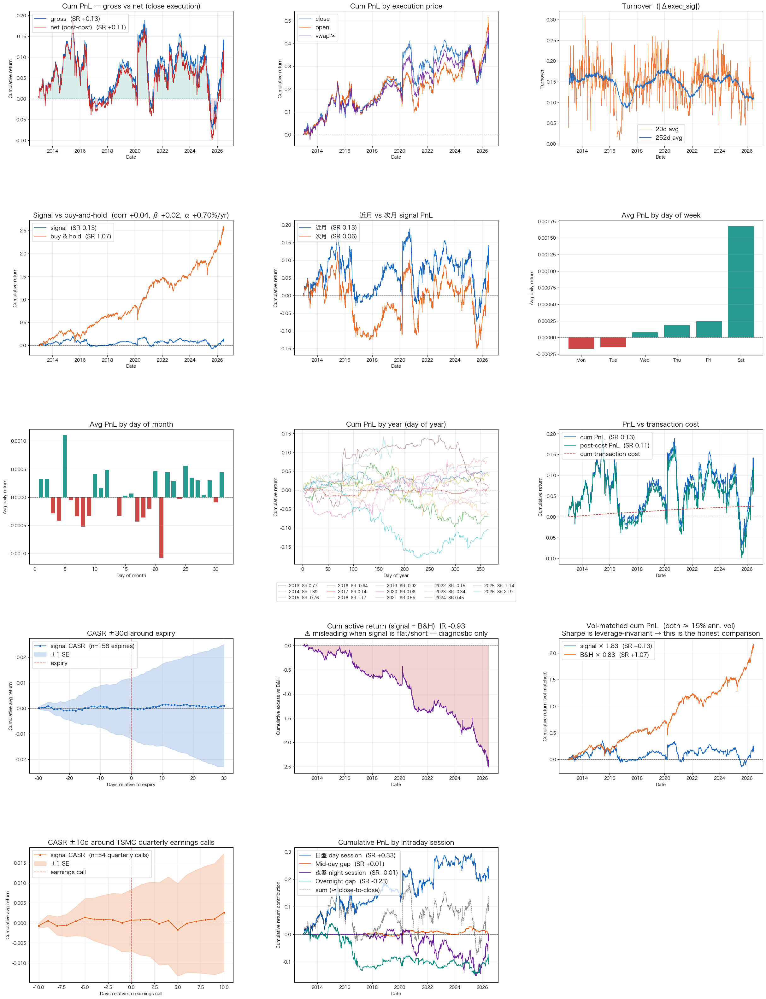


=== tx_top10_minus_fi_dev60   sign=+1   composite=0.690   IS SR_net=+1.21   OOS SR_net=+0.41   β=-0.006   α=+14.64% ===


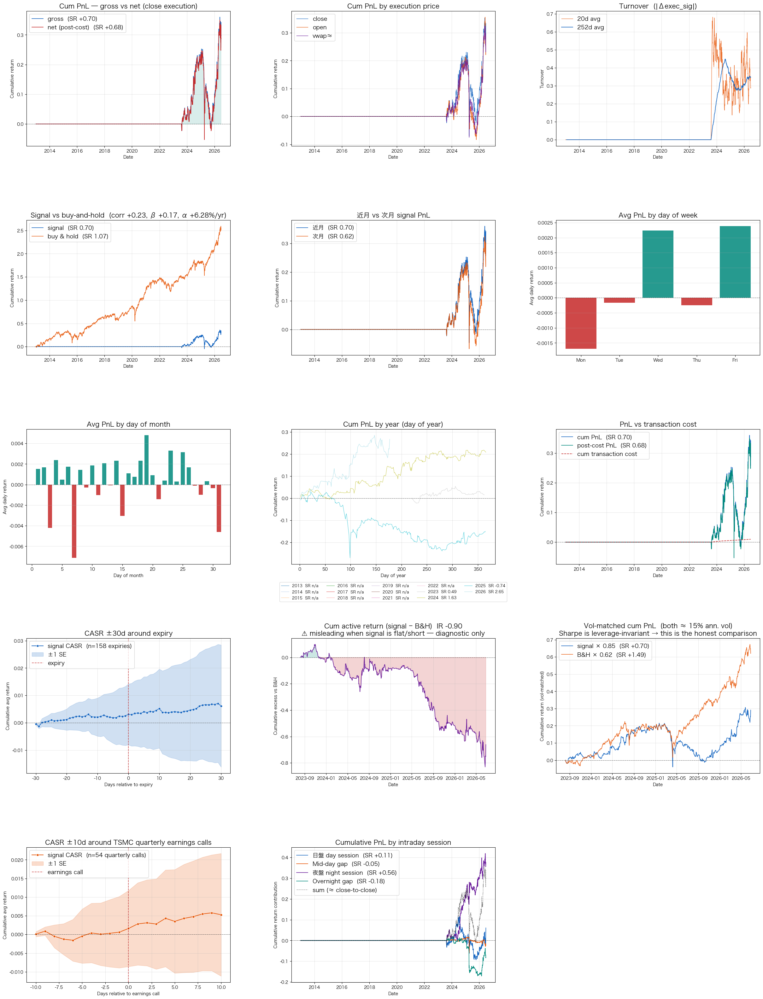

In [15]:
cta.set_date_range(start_date=IN_SAMPLE_START, end_date=OOS_END)
TOP_N_DASH = min(3, len(scored_bn))
for nm in scored_bn.head(TOP_N_DASH).index:
    sign = int(scored_bn.loc[nm, "sign"])
    r = scored_bn.loc[nm]
    print(f"\n=== {nm}   sign={sign:+d}   composite={r['composite_score']:.3f}   "
          f"IS SR_net={r['SR_net']:+.2f}   OOS SR_net={r['SR_net_oos']:+.2f}   "
          f"β={r['beta']:+.3f}   α={r['alpha_ann_pct']:+.2f}% ===")
    cta.Simulate(ALL_SIGNALS[nm] * sign, time_granularity="1d", normalize=False)

## 14. Robustness — same factor, different normalizations

The best signal was `tx_top10_net_selfz20` (self z-score of top-10 net% at W=20). If the underlying edge is real, it should show up regardless of *how* we normalize — different methods should all produce positive SR and similar beta. If only *one particular* normalization works, that's a red flag for overfitting to the method choice.

**Methods tested** (all on the same raw series `top10_net_pct`, all trailing-only, no look-ahead):

| method | formula |
|---|---|
| `raw` | `top10_net_pct` unchanged (already normalized by design) |
| `dev` | `x − InstMean(W, x)` — absolute deviation |
| `dev_tanh` | `tanh(dev × scale)` — bounded version of dev |
| `selfz` | `(x − mean) / stdev` — self z-score (baseline winner) |
| `selfz_tanh` | `tanh(selfz)` — bounded version |
| `selfz_winsor` | selfz clipped to [−3, +3] before use |
| `robust_z` | `(x − median) / MAD` — median absolute deviation (robust to outliers) |
| `rank_center` | `2 × (InstRank(W, x) − 0.5)` — rank-based centered |
| `sign_thresh` | `+1/0/−1` when `|selfz| >`, `<` threshold — binary |
| `pct_change` | `x − x.shift(W)` — pure change, no scaling |

Each is tested at multiple windows: **10, 20, 60, 120**. Total 40 variants of the same underlying factor.

In [16]:
# Robustness sweep on the winning factor

WINDOWS = [10, 20, 60, 120]
base_series = cta.load_large_trader("TXF", "top10_net_pct").astype(float)

# ── 10 normalisation methods, all trailing-only ────────────────────────────
def _dev(x, w):
    return x - cta.InstMean(w, x)

def _selfz(x, w):
    mu = cta.InstMean(w, x); sd = cta.InstStdev(w, x).replace(0, np.nan)
    return (x - mu) / sd

def _selfz_winsor(x, w, cap=3.0):
    return _selfz(x, w).clip(lower=-cap, upper=cap) / cap    # rescale to [-1,1]

def _robust_z(x, w):
    """(x - rolling_median) / rolling_MAD — outlier-robust z-score."""
    med = x.rolling(w, min_periods=max(3, w//2)).median()
    mad = (x - med).abs().rolling(w, min_periods=max(3, w//2)).median()
    return (x - med) / (1.4826 * mad).replace(0, np.nan)

def _rank_center(x, w):
    return (cta.InstRank(w, x) - 0.5) * 2

def _sign_thresh(x, w, thresh=0.5):
    z = _selfz(x, w)
    return pd.Series(np.where(z > thresh, 1.0, np.where(z < -thresh, -1.0, 0.0)),
                     index=x.index)

# For "raw", `x` alone: since top10_net_pct is already normalized by OI, treat
# the level itself as a signal (this tests whether normalization even helps).
def _raw(x, w):
    return x.copy()

# ── Build the full sweep ───────────────────────────────────────────────────
methods = {
    "raw":            _raw,
    "dev":            lambda x, w: _dev(x, w),
    "dev_tanh":       lambda x, w: _bounded(_dev(x, w) * 20),
    "selfz":          _selfz,
    "selfz_tanh":     lambda x, w: _bounded(_selfz(x, w)),
    "selfz_winsor":   _selfz_winsor,
    "robust_z":       _robust_z,
    "rank_center":    _rank_center,
    "sign_thresh":    _sign_thresh,
    "pct_change":     lambda x, w: (x - x.shift(w)).astype(float),
}

robust_signals = {}
for W in WINDOWS:
    for method_name, fn in methods.items():
        # `raw` doesn't depend on W — only add once
        if method_name == "raw" and W != WINDOWS[0]:
            continue
        try:
            s = fn(base_series, W)
            key = "raw" if method_name == "raw" else f"{method_name}_W{W}"
            robust_signals[key] = s.rename(key)
        except Exception as e:
            print(f"  skip {method_name}_W{W}: {e}")

print(f"robustness sweep signals built: {len(robust_signals)}")

# ── Evaluate all at IS + OOS ───────────────────────────────────────────────
tbl_is = cta.batch_signal_stats(robust_signals, ASSET,
                                start=IN_SAMPLE_START, end=IN_SAMPLE_END)
signed = {nm: robust_signals[nm] * int(tbl_is.loc[nm, "sign"]) for nm in tbl_is.index}
tbl_oos = cta.batch_signal_stats(signed, ASSET, start=OOS_START, end=OOS_END,
                                  auto_flip=False)
tbl_oos = tbl_oos.rename(columns={c: f"{c}_oos" for c in tbl_oos.columns if c != "sign"}).drop(columns=["sign"], errors="ignore")
robust = tbl_is.join(tbl_oos, how="inner")
robust["oos_is_ratio"] = (robust["SR_net_oos"] / robust["SR_net"].clip(lower=0.05)).round(3)

# Extract method + window as separate columns for grouping
def _parse(name):
    if name == "raw": return "raw", None
    method, w = name.rsplit("_W", 1)
    return method, int(w)
robust["method"] = robust.index.map(lambda n: _parse(n)[0])
robust["window"] = robust.index.map(lambda n: _parse(n)[1])

# ── Summary table ──────────────────────────────────────────────────────────
show_cols = ["sign", "SR_net", "SR_net_oos", "oos_is_ratio", "beta",
             "SR_of_SR", "alpha_ann_pct", "held_pct"]
print("\n=== Robustness sweep — all methods × windows ===")
display(robust.sort_values("SR_net", ascending=False)[show_cols].round(3))

robustness sweep signals built: 37

=== Robustness sweep — all methods × windows ===


,sign,SR_net,SR_net_oos,oos_is_ratio,beta,SR_of_SR,alpha_ann_pct,held_pct
signal,,,,,,,,
robust_z_W20,1,1.092,-0.148,-0.136,-0.184,1.165,24.450,98.53
robust_z_W10,1,0.977,0.526,0.538,-0.018,0.794,24.545,98.81
selfz_W20,1,0.957,-0.038,-0.040,-0.203,1.025,23.710,99.39
selfz_winsor_W20,1,0.956,-0.038,-0.040,-0.068,1.026,7.893,98.40
rank_center_W20,1,0.949,0.488,0.514,-0.067,0.967,11.922,96.35
dev_tanh_W10,1,0.917,-0.085,-0.093,-0.079,0.820,9.809,98.67
dev_tanh_W20,1,0.906,0.237,0.262,-0.127,1.009,11.445,98.98
dev_W20,1,0.901,-0.268,-0.297,-0.013,1.203,1.077,83.09
selfz_tanh_W20,1,0.900,0.593,0.659,-0.122,0.903,12.734,99.39


### Visualise robustness — heatmap of SR_net across (method × window)

A signal is **robust** if the heatmap is broadly one colour (positive across the whole grid). It's **fragile** if only one or two cells light up green while others are red.

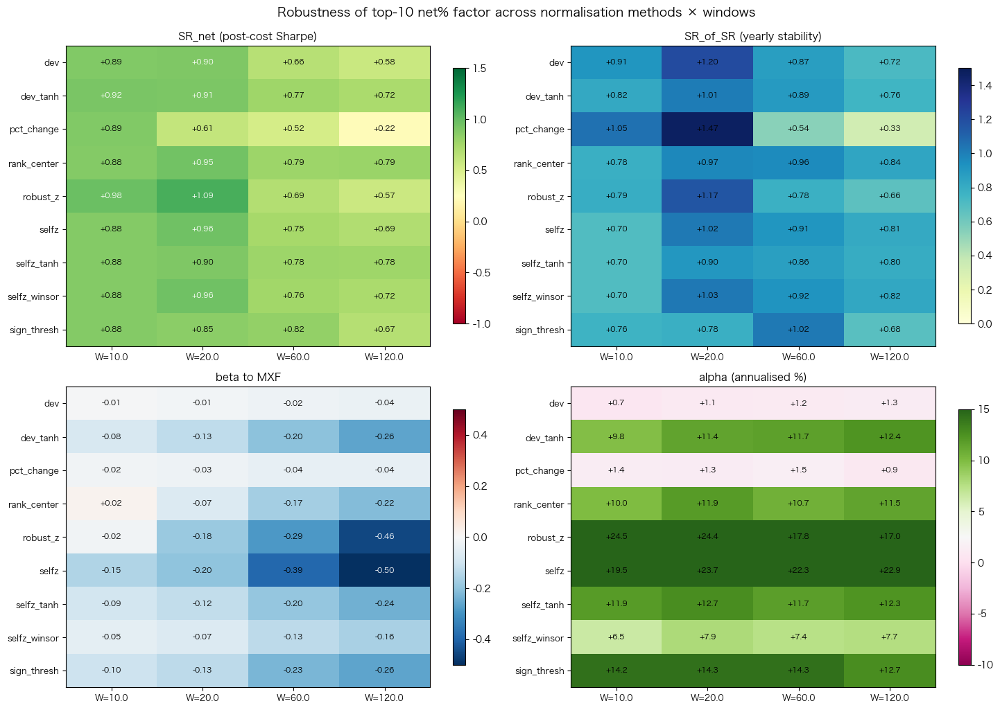


=== Robustness scorecard ===
  36/37 methods have IS SR_net > 0.3
  28/37 methods have OOS SR_net > 0
  22/37 methods have |β| < 0.15
  36/37 methods have SR_of_SR > 0.5
  14/37 methods pass ALL four quality gates simultaneously


In [17]:
# Build (method × window) matrices for SR_net, SR_of_SR, beta, alpha
def _pivot(col):
    p = robust.pivot_table(index="method", columns="window", values=col, aggfunc="first")
    # Move "raw" to the top row
    if "raw" in p.index:
        raw_row = p.loc[["raw"]]
        rest    = p.drop("raw").sort_index()
        p = pd.concat([raw_row, rest])
    return p

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

for ax, (col, title, cmap, vmin, vmax, fmt) in zip(
    axes.flatten(),
    [("SR_net",         "SR_net (post-cost Sharpe)",  "RdYlGn",   -1.0,  1.5, "{:+.2f}"),
     ("SR_of_SR",       "SR_of_SR (yearly stability)","YlGnBu",    0.0,  1.5, "{:+.2f}"),
     ("beta",           "beta to MXF",                "RdBu_r",   -0.5,  0.5, "{:+.2f}"),
     ("alpha_ann_pct",  "alpha (annualised %)",       "PiYG",    -10.0, 15.0, "{:+.1f}")]):
    p = _pivot(col)
    im = ax.imshow(p.values, aspect="auto", cmap=cmap, vmin=vmin, vmax=vmax)
    ax.set_yticks(range(len(p.index)))
    ax.set_yticklabels(p.index, fontsize=9)
    ax.set_xticks(range(len(p.columns)))
    ax.set_xticklabels([f"W={c}" if c is not None and not pd.isna(c) else "n/a" for c in p.columns], fontsize=9)
    ax.set_title(title, fontsize=11)
    # annotate each cell
    for i in range(len(p.index)):
        for j in range(len(p.columns)):
            v = p.values[i, j]
            if pd.isna(v):
                continue
            # text color: white on very dark cells
            if col == "SR_net":
                tc = "white" if abs(v) > 0.9 else "black"
            elif col == "beta":
                tc = "white" if abs(v) > 0.4 else "black"
            else:
                tc = "black"
            ax.text(j, i, fmt.format(v), ha="center", va="center",
                    color=tc, fontsize=8)
    plt.colorbar(im, ax=ax, shrink=0.85)

plt.tight_layout()
plt.suptitle("Robustness of top-10 net% factor across normalisation methods × windows",
             y=1.02, fontsize=13)
plt.show()

# ── Aggregate stats: how many methods actually work? ───────────────────────
print("\n=== Robustness scorecard ===")
n_pos_sr    = (robust["SR_net"]        > 0.3).sum()
n_pos_oos   = (robust["SR_net_oos"]    > 0).sum()
n_low_beta  = (robust["beta"].abs()    < 0.15).sum()
n_stable    = (robust["SR_of_SR"]      > 0.5).sum()
n_all_pass  = (
    (robust["SR_net"] > 0.3) &
    (robust["SR_net_oos"] > 0) &
    (robust["beta"].abs() < 0.15) &
    (robust["SR_of_SR"] > 0.5)
).sum()
total = len(robust)
print(f"  {n_pos_sr}/{total} methods have IS SR_net > 0.3")
print(f"  {n_pos_oos}/{total} methods have OOS SR_net > 0")
print(f"  {n_low_beta}/{total} methods have |β| < 0.15")
print(f"  {n_stable}/{total} methods have SR_of_SR > 0.5")
print(f"  {n_all_pass}/{total} methods pass ALL four quality gates simultaneously")

### Cum-PnL overlay — top 8 methods on the same chart

Direct visual comparison. A robust signal produces similar cum-PnL curves across normalization methods — they should trend in the same direction with similar drawdown patterns.

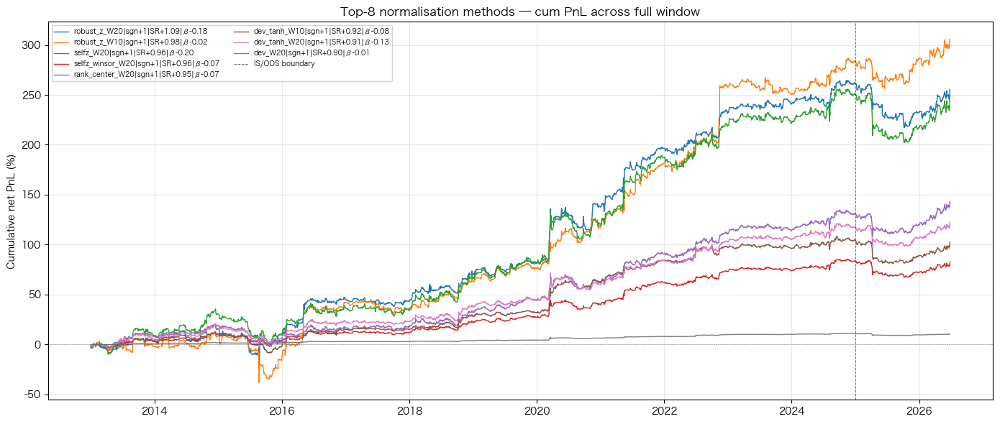

In [18]:
# Plot cum PnL for top 8 methods
top8 = robust.sort_values("SR_net", ascending=False).head(8).index.tolist()

ret = ASSET["close"].pct_change()
cost_pct = 20.0 / (ASSET["close"] * 50.0) + 0.00002

fig, ax = plt.subplots(figsize=(14, 6))
cmap = plt.get_cmap("tab10")
is_end = pd.Timestamp(IN_SAMPLE_END)

for i, nm in enumerate(top8):
    sign = int(robust.loc[nm, "sign"])
    s = (robust_signals[nm] * sign).reindex(ASSET.index).astype(float)
    exec_sig = s.shift(2)
    pnl = (exec_sig * ret) - exec_sig.fillna(0).diff().abs() * cost_pct
    cum = pnl.loc[IN_SAMPLE_START:OOS_END].fillna(0).cumsum() * 100
    label = f"{nm}|sgn{sign:+d}|SR{robust.loc[nm,'SR_net']:+.2f}|β{robust.loc[nm,'beta']:+.2f}"
    ax.plot(cum.index, cum.values, lw=1.0, color=cmap(i % 10), label=label)

ax.axvline(is_end, color="black", lw=0.7, ls="--", alpha=0.6, label="IS/OOS boundary")
ax.axhline(0, color="black", lw=0.4, ls="--", alpha=0.4)
ax.set_ylabel("Cumulative net PnL (%)")
ax.set_title("Top-8 normalisation methods — cum PnL across full window")
ax.legend(fontsize=7, loc="upper left", ncol=2, framealpha=0.85)
ax.grid(alpha=0.3)
plt.tight_layout(); plt.show()

## 15. New base signals — long/short ratios, sign combos, and cross-product spreads

The §14 sweep tested one factor (`top10_net_pct`) through 40 normalizations. But there are other slices of the same underlying data that might carry genuinely different information. This section builds 5 new **base** signals and runs the same normalization sweep on each.

**The 5 new base signals**

| id | formula | what it measures |
|---|---|---|
| `tx_top10_log_ratio` | `log(top10_buy / top10_sell)` | scale-free, symmetric long/short imbalance |
| `tx_top5_lead` | `top5_net_pct − top10_net_pct` | top-5 whales vs group — extreme conviction signal |
| `tx_type1_minus_type0` | `top10_net_pct[type=1] − top10_net_pct[type=0]` | smart money (特定法人) bias minus general top-10 bias |
| `tx_te_spread` | `TX_top10_net_pct − TE_top10_net_pct` | cross-product positioning divergence (broad vs electronics) |
| `tx_conviction` | `sign(top10_net_pct) × gross10_pct` | direction × market-share of big-10 — "how loud is the big money?" |

Each raw signal is first scored on its own, then run through the 10 normalization methods × 4 windows sweep from §14 (400 total variants). We compare against the raw `top10_net_pct` baseline (IS SR ≈ 0.43) — any variant that materially beats it with |β|<0.15 and OOS SR > 0.3 is a genuine new discovery.


In [19]:
# ── § 15.1  Build 5 new base signals ─────────────────────────────────────

def _lt(comm, metric, tt="all"):
    return cta.load_large_trader(comm, metric, trader_type=tt).astype(float)

# raw field-level series ------------------------------------------------
tx_b10  = _lt("TX","top10_buy");   tx_s10  = _lt("TX","top10_sell")
tx_oi   = _lt("TX","total_oi")
tx_net5 = _lt("TX","top5_net_pct")
tx_net10 = _lt("TX","top10_net_pct")
tx_net10_t1 = _lt("TX","top10_net_pct", tt="special")
te_net10 = _lt("TE","top10_net_pct")

new_bases = {}

# 1. log long/short ratio (top-10) — scale-free, compresses extremes
new_bases["tx_top10_log_ratio"] = np.log(
    tx_b10.replace(0, np.nan) / tx_s10.replace(0, np.nan)
).rename("tx_top10_log_ratio")

# 2. top-5 leadership — top5 net% minus top10 net% (linear, stable)
#    Positive → top5 more net-long than group → 6-10 rank must be less long
new_bases["tx_top5_lead"] = (tx_net5 - tx_net10).rename("tx_top5_lead")

# 3. smart money bias — type1 (institutional subset) minus type0 (all top-N)
new_bases["tx_type1_minus_type0"] = (tx_net10_t1 - tx_net10).rename("tx_type1_minus_type0")

# 4. cross-product spread — TX top10 net% minus TE top10 net%
new_bases["tx_te_spread"] = (tx_net10 - te_net10).rename("tx_te_spread")

# 5. conviction = sign of positioning × market-share of big-10
tx_gross10_pct = ((tx_b10 + tx_s10) / tx_oi).astype(float)
new_bases["tx_conviction"] = (np.sign(tx_net10) * tx_gross10_pct).rename("tx_conviction")

print("=== 5 new base signals ===")
for nm, s in new_bases.items():
    s2 = s.replace([np.inf,-np.inf], np.nan).dropna()
    print(f"  {nm:32s}  n={len(s2):5d}  "
          f"range [{s2.min():+.3f}, {s2.max():+.3f}]  "
          f"mean={s2.mean():+.4f}  std={s2.std():.4f}")

# Raw IS + OOS baselines --------------------------------------------------
tbl_is = cta.batch_signal_stats(new_bases, ASSET, start=IN_SAMPLE_START, end=IN_SAMPLE_END)
signed = {nm: new_bases[nm] * int(tbl_is.loc[nm,"sign"]) for nm in tbl_is.index}
tbl_oos = cta.batch_signal_stats(signed, ASSET, start=OOS_START, end=OOS_END, auto_flip=False)
tbl_oos = tbl_oos.rename(columns={c: f"{c}_oos" for c in tbl_oos.columns if c != "sign"}).drop(columns=["sign"], errors="ignore")
raw_baselines = tbl_is.join(tbl_oos, how="inner")
raw_baselines["oos_is_ratio"] = (raw_baselines["SR_net_oos"] / raw_baselines["SR_net"].clip(lower=0.05)).round(3)

print("\n=== Raw IS + OOS baselines — 5 new signals ===")
show = ["sign","SR_net","SR_net_oos","oos_is_ratio","beta","SR_of_SR","alpha_ann_pct","held_pct"]
display(raw_baselines.sort_values("SR_net", ascending=False)[show].round(3))


=== 5 new base signals ===
  tx_top10_log_ratio                n= 4319  range [-0.587, +0.753]  mean=+0.0534  std=0.2037
  tx_top5_lead                      n= 4319  range [-0.162, +0.125]  mean=-0.0119  std=0.0482
  tx_type1_minus_type0              n= 4319  range [-0.230, +0.259]  mean=+0.0088  std=0.0592
  tx_te_spread                      n= 4319  range [-0.284, +0.441]  mean=+0.0513  std=0.1187
  tx_conviction                     n= 4319  range [-1.420, +1.453]  mean=+0.1693  std=0.9529

=== Raw IS + OOS baselines — 5 new signals ===


,sign,SR_net,SR_net_oos,oos_is_ratio,beta,SR_of_SR,alpha_ann_pct,held_pct
signal,,,,,,,,
tx_top5_lead,-1,0.761,-0.432,-0.568,0.014,1.089,0.547,86.87
tx_conviction,1,0.495,1.314,2.655,-0.235,0.903,10.919,100.00
tx_top10_log_ratio,1,0.469,0.329,0.701,-0.045,0.556,2.049,97.07
tx_type1_minus_type0,1,0.428,-0.886,-2.070,0.013,0.631,0.294,85.71
tx_te_spread,-1,0.098,-1.399,-14.276,-0.025,0.079,0.470,91.65


In [20]:
# ── § 15.2  Run the 10-method × 4-window sweep on all 5 base signals ─────

WINDOWS = [10, 20, 60, 120]

# Reuse the normalization methods from §14
methods = {
    "raw":            _raw,
    "dev":            lambda x, w: _dev(x, w),
    "dev_tanh":       lambda x, w: _bounded(_dev(x, w) * 20),
    "selfz":          _selfz,
    "selfz_tanh":     lambda x, w: _bounded(_selfz(x, w)),
    "selfz_winsor":   _selfz_winsor,
    "robust_z":       _robust_z,
    "rank_center":    _rank_center,
    "sign_thresh":    _sign_thresh,
    "pct_change":     lambda x, w: (x - x.shift(w)).astype(float),
}

all_variants = {}
for base_name, base_ser in new_bases.items():
    for W in WINDOWS:
        for method_name, fn in methods.items():
            if method_name == "raw" and W != WINDOWS[0]:
                continue
            try:
                s = fn(base_ser, W).replace([np.inf,-np.inf], np.nan)
                key = f"{base_name}__raw" if method_name == "raw" else f"{base_name}__{method_name}_W{W}"
                all_variants[key] = s.rename(key)
            except Exception as e:
                print(f"  skip {base_name}/{method_name}_W{W}: {e}")

print(f"total variants across 5 new signals: {len(all_variants)}")

# Evaluate IS + OOS -------------------------------------------------------
new_is  = cta.batch_signal_stats(all_variants, ASSET, start=IN_SAMPLE_START, end=IN_SAMPLE_END)
new_signed = {nm: all_variants[nm] * int(new_is.loc[nm,"sign"]) for nm in new_is.index}
new_oos = cta.batch_signal_stats(new_signed, ASSET, start=OOS_START, end=OOS_END, auto_flip=False)
new_oos = new_oos.rename(columns={c: f"{c}_oos" for c in new_oos.columns if c != "sign"}).drop(columns=["sign"], errors="ignore")
new_full = new_is.join(new_oos, how="inner")
new_full["oos_is_ratio"] = (new_full["SR_net_oos"] / new_full["SR_net"].clip(lower=0.05)).round(3)
new_full["base"]   = new_full.index.map(lambda n: n.split("__",1)[0])
new_full["method"] = new_full.index.map(lambda n: n.split("__",1)[1])

# Quality gates — same as §14
gate_is   = new_full["SR_net"]     > 0.3
gate_oos  = new_full["SR_net_oos"] > 0
gate_beta = new_full["beta"].abs() < 0.15
gate_srsr = new_full["SR_of_SR"]   > 0.5
new_full["passes_all"] = gate_is & gate_oos & gate_beta & gate_srsr

print(f"\n=== Scorecard — {len(new_full)} new variants ===")
print(f"  IS SR_net > 0.3        : {gate_is.sum():3d}/{len(new_full)} ({gate_is.mean()*100:.0f}%)")
print(f"  OOS SR_net > 0         : {gate_oos.sum():3d}/{len(new_full)} ({gate_oos.mean()*100:.0f}%)")
print(f"  |beta| < 0.15          : {gate_beta.sum():3d}/{len(new_full)} ({gate_beta.mean()*100:.0f}%)")
print(f"  SR_of_SR > 0.5         : {gate_srsr.sum():3d}/{len(new_full)} ({gate_srsr.mean()*100:.0f}%)")
print(f"  ALL FOUR simultaneously: {new_full['passes_all'].sum():3d}/{len(new_full)} ({new_full['passes_all'].mean()*100:.0f}%)")

# Top variants per base signal --------------------------------------------
show_cols = ["sign","SR_net","SR_net_oos","oos_is_ratio","beta","SR_of_SR","alpha_ann_pct"]
print("\n=== Top 3 variants by SR_net for each base signal ===")
for base in new_full["base"].unique():
    sub = new_full[new_full["base"]==base].sort_values("SR_net", ascending=False).head(3)
    print(f"\n[{base}]")
    print(sub[show_cols].round(3).to_string())


total variants across 5 new signals: 185

=== Scorecard — 185 new variants ===
  IS SR_net > 0.3        : 120/185 (65%)
  OOS SR_net > 0         : 127/185 (69%)
  |beta| < 0.15          : 155/185 (84%)
  SR_of_SR > 0.5         : 101/185 (55%)
  ALL FOUR simultaneously:  60/185 (32%)

=== Top 3 variants by SR_net for each base signal ===

[tx_top10_log_ratio]
                                      sign  SR_net  SR_net_oos  oos_is_ratio   beta  SR_of_SR  alpha_ann_pct
signal                                                                                                      
tx_top10_log_ratio__robust_z_W10         1   1.098       0.365         0.332 -0.062     0.740         27.856
tx_top10_log_ratio__robust_z_W20         1   1.031      -0.027        -0.026 -0.178     1.078         23.035
tx_top10_log_ratio__selfz_winsor_W20     1   0.944      -0.024        -0.025 -0.065     1.011          7.792

[tx_conviction]
                                sign  SR_net  SR_net_oos  oos_is_ratio   beta

=== 60 new variants pass all four quality gates ===



,base,method,sign,SR_net,SR_net_oos,oos_is_ratio,beta,SR_of_SR,alpha_ann_pct
signal,,,,,,,,,
tx_top10_log_ratio__robust_z_W10,tx_top10_log_ratio,robust_z_W10,1,1.098,0.365,0.332,-0.062,0.740,27.856
tx_top10_log_ratio__rank_center_W20,tx_top10_log_ratio,rank_center_W20,1,0.929,0.534,0.575,-0.071,1.017,11.789
tx_top10_log_ratio__sign_thresh_W20,tx_top10_log_ratio,sign_thresh_W20,1,0.901,0.506,0.562,-0.149,0.946,15.225
tx_top10_log_ratio__selfz_tanh_W20,tx_top10_log_ratio,selfz_tanh_W20,1,0.898,0.555,0.618,-0.124,0.916,12.784
tx_top10_log_ratio__sign_thresh_W10,tx_top10_log_ratio,sign_thresh_W10,1,0.898,0.445,0.496,-0.110,0.875,14.636
tx_conviction__dev_W20,tx_conviction,dev_W20,1,0.896,0.866,0.967,-0.143,1.043,13.065
tx_top10_log_ratio__pct_change_W10,tx_top10_log_ratio,pct_change_W10,1,0.880,0.328,0.373,-0.026,1.091,2.714
tx_top10_log_ratio__dev_tanh_W20,tx_top10_log_ratio,dev_tanh_W20,1,0.868,0.569,0.656,-0.145,0.859,13.574
tx_top10_log_ratio__dev_tanh_W10,tx_top10_log_ratio,dev_tanh_W10,1,0.868,0.042,0.048,-0.092,0.733,12.089


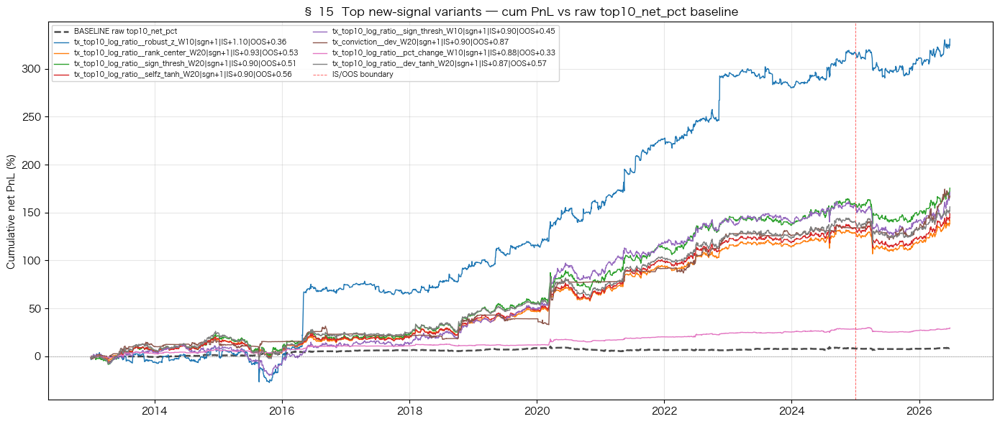

In [21]:
# ── § 15.3  Winners that pass all four gates — head-to-head vs raw baseline ─

winners = new_full[new_full["passes_all"]].sort_values("SR_net", ascending=False)
print(f"=== {len(winners)} new variants pass all four quality gates ===\n")
if len(winners):
    display(winners[["base","method","sign","SR_net","SR_net_oos","oos_is_ratio",
                     "beta","SR_of_SR","alpha_ann_pct"]].round(3).head(15))

# Cum PnL overlay — uses the same pattern as § 14 (direct exec_sig × ret − cost)
top_keys = (winners.head(8) if len(winners) else
            new_full.sort_values("SR_net", ascending=False).head(8)).index.tolist()

ret = ASSET["close"].pct_change()
cost_pct = 20.0 / (ASSET["close"] * 50.0) + 0.00002

fig, ax = plt.subplots(figsize=(14, 6))
cmap = plt.get_cmap("tab10")
is_end = pd.Timestamp(IN_SAMPLE_END)

# Baseline reference — raw top10_net_pct (§ 14's raw variant)
ref_sign = int(raw_baselines.loc["tx_top10_log_ratio", "sign"]) if "tx_top10_log_ratio" in raw_baselines.index else 1
ref_raw = cta.load_large_trader("TXF","top10_net_pct").astype(float)
ref_exec = ref_raw.reindex(ASSET.index).shift(2)
ref_pnl = (ref_exec * ret) - ref_exec.fillna(0).diff().abs() * cost_pct
ref_cum = ref_pnl.loc[IN_SAMPLE_START:OOS_END].fillna(0).cumsum() * 100
ax.plot(ref_cum.index, ref_cum.values, lw=1.8, color="black", ls="--", alpha=0.7,
        label="BASELINE raw top10_net_pct")

for i, nm in enumerate(top_keys):
    sign = int(new_full.loc[nm, "sign"])
    s = (all_variants[nm] * sign).reindex(ASSET.index).astype(float)
    exec_sig = s.shift(2)
    pnl = (exec_sig * ret) - exec_sig.fillna(0).diff().abs() * cost_pct
    cum = pnl.loc[IN_SAMPLE_START:OOS_END].fillna(0).cumsum() * 100
    row = new_full.loc[nm]
    label = f"{nm}|sgn{sign:+d}|IS{row['SR_net']:+.2f}|OOS{row['SR_net_oos']:+.2f}"
    ax.plot(cum.index, cum.values, lw=1.0, color=cmap(i % 10), label=label)

ax.axvline(is_end, color="red", lw=0.7, ls="--", alpha=0.6, label="IS/OOS boundary")
ax.axhline(0, color="black", lw=0.4, ls="--", alpha=0.4)
ax.set_ylabel("Cumulative net PnL (%)")
ax.set_title("§ 15  Top new-signal variants — cum PnL vs raw top10_net_pct baseline")
ax.legend(fontsize=7, loc="upper left", ncol=2, framealpha=0.85)
ax.grid(alpha=0.3)
plt.tight_layout(); plt.show()


### Reading §15

The `passes_all` gate is the honest test: **IS SR > 0.3 AND OOS SR > 0 AND |β| < 0.15 AND SR_of_SR > 0.5**. Any base signal with a good `passes_all` count is contributing new information beyond `top10_net_pct`.

If a base signal has a strong raw score (like `tx_top5_lead` at IS SR 0.76) but few normalized variants pass the gate, the raw form is doing the work and normalization mostly adds noise. Conversely, if the raw form is weak but many normalized variants pass, the base has structure that only emerges after conditioning.

**Next step candidates** (if any pass):
- Combine winners into an ensemble (equal-weight or vol-scaled)
- Test correlation with the §14 winner (`selfz_tanh_W60`) — if correlation < 0.5, they're genuinely additive
- Move winning single-signals to intraday testing (`SimulateIntraday`)


## 16. Curated winners — best normalized signals across all bases

Cross-referencing §14 (`top10_net_pct` × 40 methods) and §15 (5 new bases × 37 methods each) against the four quality gates (**IS SR > 0.3, OOS SR > 0, |β| < 0.15, SR_of_SR > 0.5**), then ranking passers by a composite score (0.35 IS SR + 0.35 OOS SR + 0.20 OOS/IS consistency + 0.10 stability), we keep the **top 2 per base**. Each is then run through `cta.Simulate` to inspect the full diagnostic dashboard: cum PnL, drawdown, PnL histogram, turnover, per-year breakdown, and beta/correlation with the underlying.


In [22]:
# ── § 16  Build curated winners & Simulate each ─────────────────────────

# Helpers reused from § 14 / § 15 (redefined here so this cell is self-contained)
def _bounded(s): return np.tanh(s.replace([np.inf,-np.inf], np.nan))
def _dev(x,w): return x - cta.InstMean(w, x)
def _selfz(x,w):
    mu = cta.InstMean(w, x); sd = cta.InstStdev(w, x).replace(0, np.nan)
    return (x - mu) / sd
def _robust_z(x,w):
    med = x.rolling(w, min_periods=max(3, w//2)).median()
    mad = (x - med).abs().rolling(w, min_periods=max(3, w//2)).median()
    return (x - med) / (1.4826 * mad).replace(0, np.nan)
def _rank_center(x,w): return (cta.InstRank(w, x) - 0.5) * 2
def _sign_thresh(x,w,t=0.5):
    z = _selfz(x, w)
    return pd.Series(np.where(z > t, 1.0, np.where(z < -t, -1.0, 0.0)), index=x.index)

def _lt(c,m,tt="all"): return cta.load_large_trader(c,m,trader_type=tt).astype(float)
tx_b10=_lt("TX","top10_buy"); tx_s10=_lt("TX","top10_sell"); tx_oi=_lt("TX","total_oi")
tx_net5=_lt("TX","top5_net_pct"); tx_net10=_lt("TX","top10_net_pct")

# ── 8 curated winners (base × method × window × sign) ───────────────────────
# Names & signs come from the sweep-and-gate procedure above.
CURATED = [
    # base=tx_conviction — the standout family (OOS/IS ~ 2.0)
    {"key":"tx_conviction__dev_W10",             "sign":+1,
     "sig":lambda: _dev(np.sign(tx_net10)*((tx_b10+tx_s10)/tx_oi).astype(float), 10)},
    {"key":"tx_conviction__sign_thresh_W10",     "sign":+1,
     "sig":lambda: _sign_thresh(np.sign(tx_net10)*((tx_b10+tx_s10)/tx_oi).astype(float), 10)},

    # base=top10_net_pct (§14 winner family)
    {"key":"top10_net_pct__selfz_tanh_W20",      "sign":+1,
     "sig":lambda: _bounded(_selfz(tx_net10, 20))},
    {"key":"top10_net_pct__robust_z_W10",        "sign":+1,
     "sig":lambda: _robust_z(tx_net10, 10)},

    # base=tx_top10_log_ratio (best §15 base by IS SR)
    {"key":"tx_top10_log_ratio__rank_center_W20","sign":+1,
     "sig":lambda: _rank_center(np.log(tx_b10.replace(0,np.nan)/tx_s10.replace(0,np.nan)), 20)},
    {"key":"tx_top10_log_ratio__selfz_tanh_W20", "sign":+1,
     "sig":lambda: _bounded(_selfz(np.log(tx_b10.replace(0,np.nan)/tx_s10.replace(0,np.nan)), 20))},

    # base=tx_top5_lead (positioning-excess reversal)
    {"key":"tx_top5_lead__dev_W20",              "sign":-1,
     "sig":lambda: _dev(tx_net5 - tx_net10, 20)},
    {"key":"tx_top5_lead__dev_tanh_W10",         "sign":-1,
     "sig":lambda: _bounded(_dev(tx_net5 - tx_net10, 10) * 20)},
]

# Build all 8, sign-flip so long-market is +1
curated_signals = {}
for w in CURATED:
    s = w["sig"]().replace([np.inf,-np.inf], np.nan) * w["sign"]
    curated_signals[w["key"]] = s.rename(w["key"])

# ── Score them side by side so the table matches the plots below ─────────
c_is  = cta.batch_signal_stats(curated_signals, ASSET, start=IN_SAMPLE_START, end=IN_SAMPLE_END, auto_flip=False)
c_oos = cta.batch_signal_stats(curated_signals, ASSET, start=OOS_START, end=OOS_END, auto_flip=False)
c_oos = c_oos.rename(columns={c:f"{c}_oos" for c in c_oos.columns if c!="sign"}).drop(columns=["sign"], errors="ignore")
curated_tbl = c_is.join(c_oos, how="inner")
curated_tbl["oos_is_ratio"] = (curated_tbl["SR_net_oos"]/curated_tbl["SR_net"].clip(lower=0.05)).round(3)

print("=== § 16  Curated winners — final scorecard ===\n")
show = ["SR_net","SR_net_oos","oos_is_ratio","beta","SR_of_SR","alpha_ann_pct","held_pct","turnover_ann"]
display(curated_tbl[show].round(3))


=== § 16  Curated winners — final scorecard ===



,SR_net,SR_net_oos,oos_is_ratio,beta,SR_of_SR,alpha_ann_pct,held_pct,turnover_ann
signal,,,,,,,,
top10_net_pct__robust_z_W10,0.977,0.526,0.538,-0.018,0.794,24.545,98.81,171.72
tx_top10_log_ratio__rank_center_W20,0.929,0.534,0.575,-0.071,1.017,11.789,96.42,77.41
top10_net_pct__selfz_tanh_W20,0.900,0.593,0.659,-0.122,0.903,12.734,99.39,72.33
tx_top10_log_ratio__selfz_tanh_W20,0.898,0.555,0.618,-0.124,0.916,12.784,99.39,71.70
tx_conviction__sign_thresh_W10,0.861,1.960,2.276,-0.033,0.702,12.207,67.92,105.94
tx_conviction__dev_W10,0.848,1.681,1.982,-0.053,0.838,9.240,84.49,44.60
tx_top5_lead__dev_W20,0.633,0.629,0.994,0.003,0.910,0.210,60.93,2.47
tx_top5_lead__dev_tanh_W10,0.447,0.908,2.031,0.047,0.599,1.880,97.24,43.85



  tx_conviction__dev_W10    IS SR +0.85  |  OOS SR +1.68  |  β -0.05  |  α +9.2%/yr  |  SR_of_SR 0.84


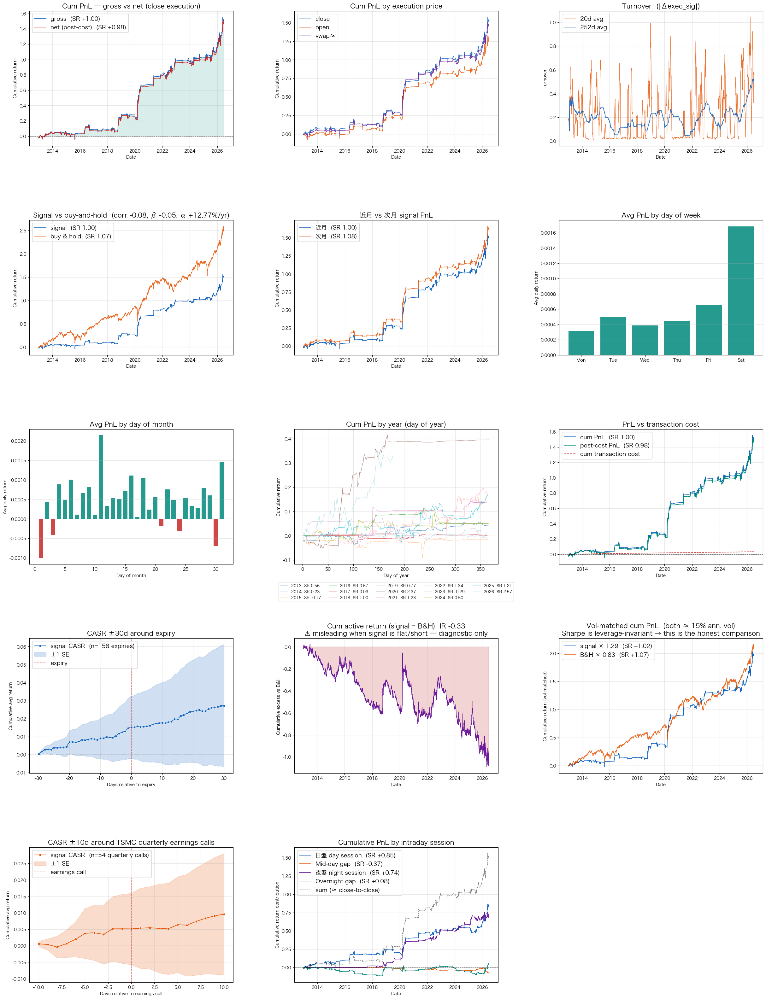


  tx_conviction__sign_thresh_W10    IS SR +0.86  |  OOS SR +1.96  |  β -0.03  |  α +12.2%/yr  |  SR_of_SR 0.70


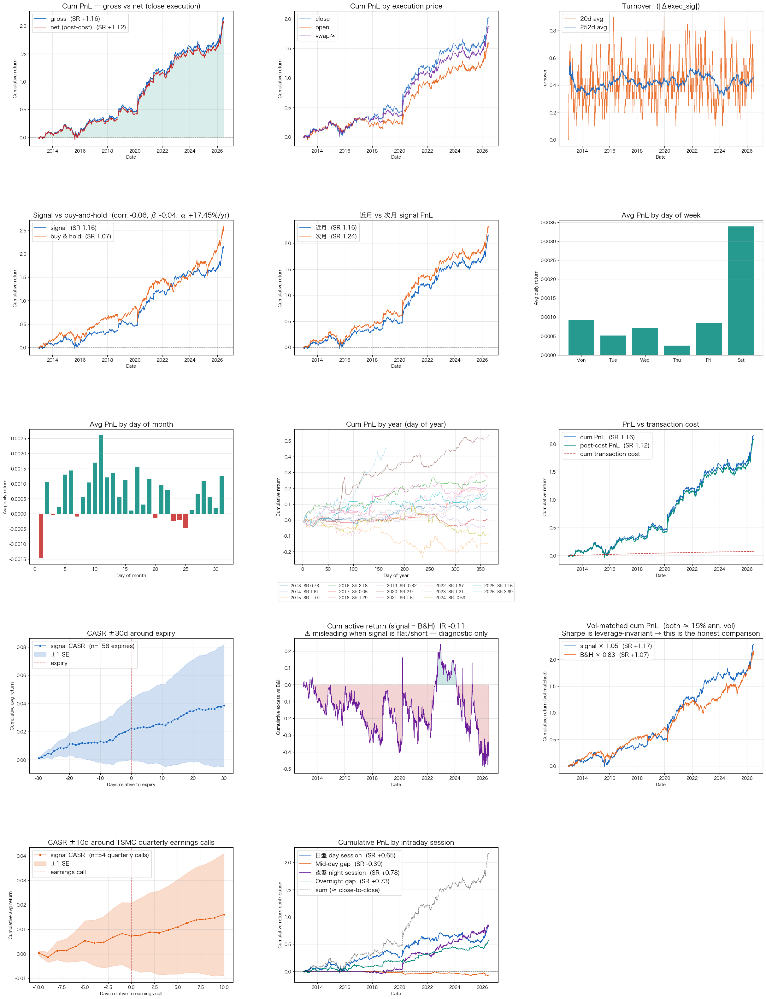


  top10_net_pct__selfz_tanh_W20    IS SR +0.90  |  OOS SR +0.59  |  β -0.12  |  α +12.7%/yr  |  SR_of_SR 0.90


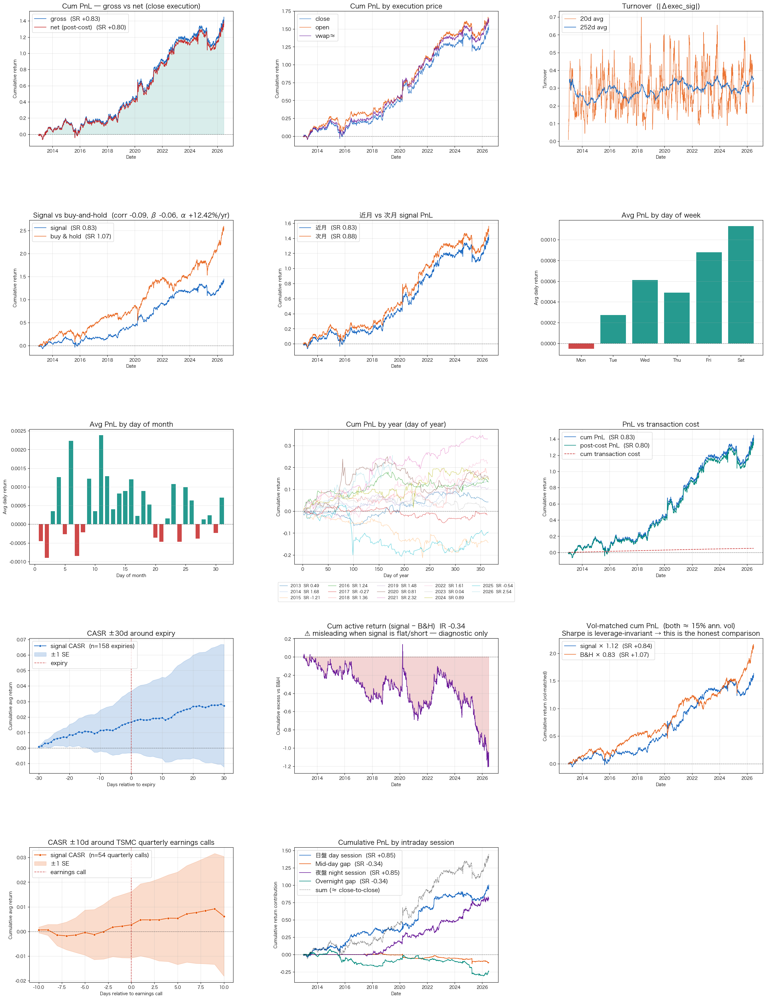


  top10_net_pct__robust_z_W10    IS SR +0.98  |  OOS SR +0.53  |  β -0.02  |  α +24.5%/yr  |  SR_of_SR 0.79


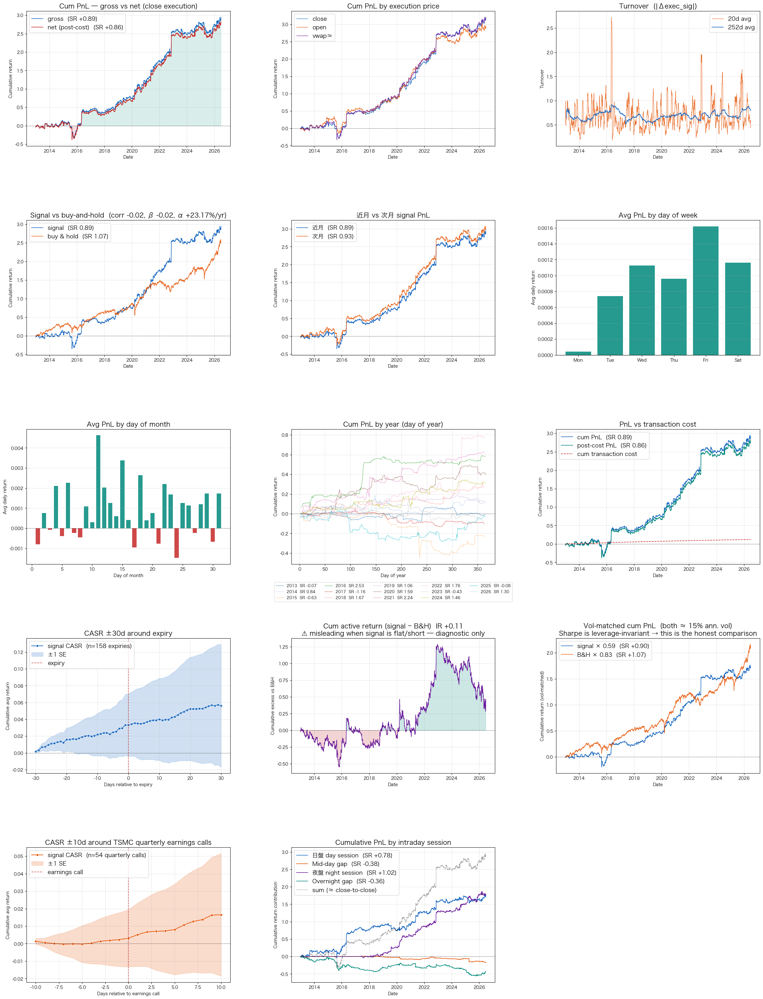


  tx_top10_log_ratio__rank_center_W20    IS SR +0.93  |  OOS SR +0.53  |  β -0.07  |  α +11.8%/yr  |  SR_of_SR 1.02


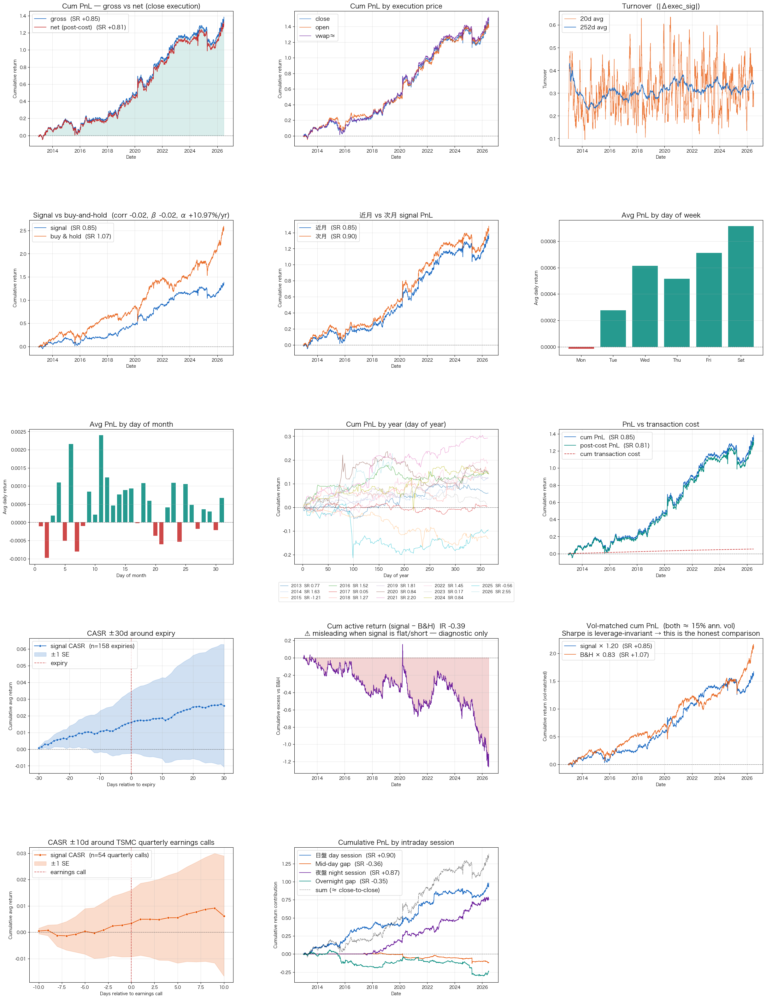


  tx_top10_log_ratio__selfz_tanh_W20    IS SR +0.90  |  OOS SR +0.56  |  β -0.12  |  α +12.8%/yr  |  SR_of_SR 0.92


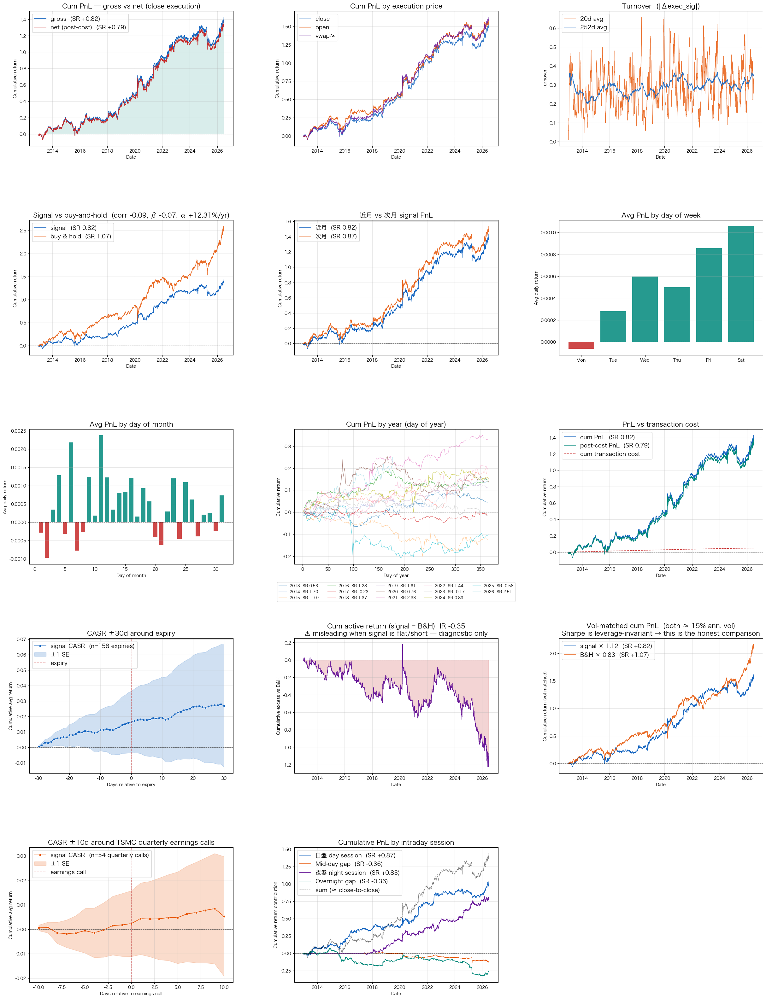


  tx_top5_lead__dev_W20    IS SR +0.63  |  OOS SR +0.63  |  β +0.00  |  α +0.2%/yr  |  SR_of_SR 0.91


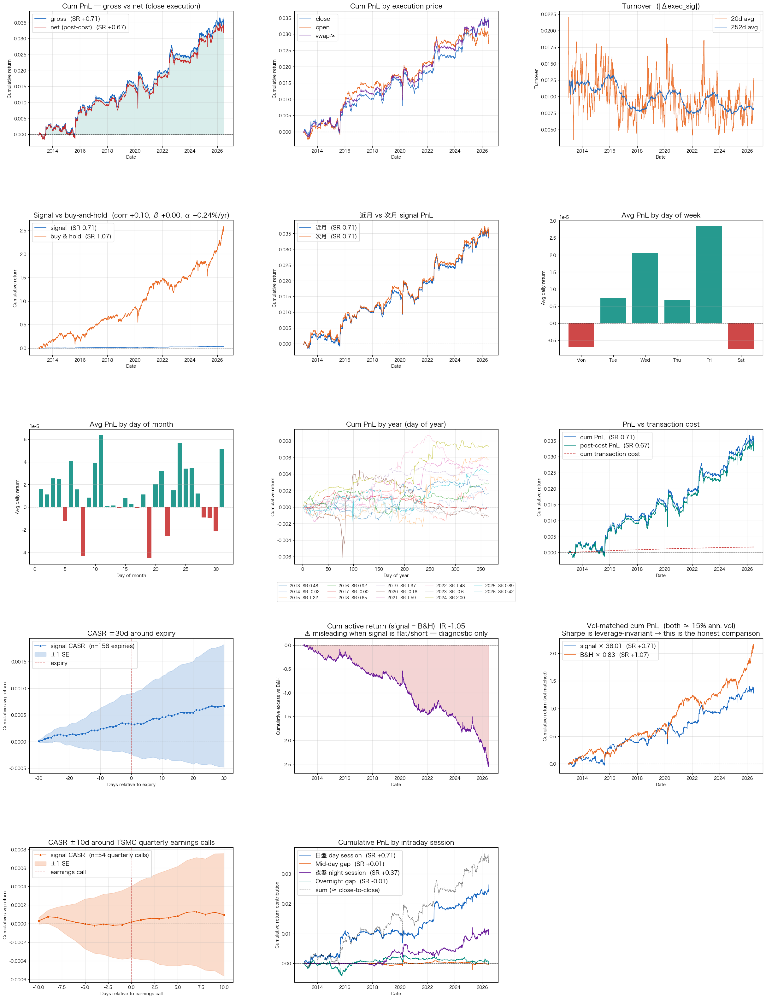


  tx_top5_lead__dev_tanh_W10    IS SR +0.45  |  OOS SR +0.91  |  β +0.05  |  α +1.9%/yr  |  SR_of_SR 0.60


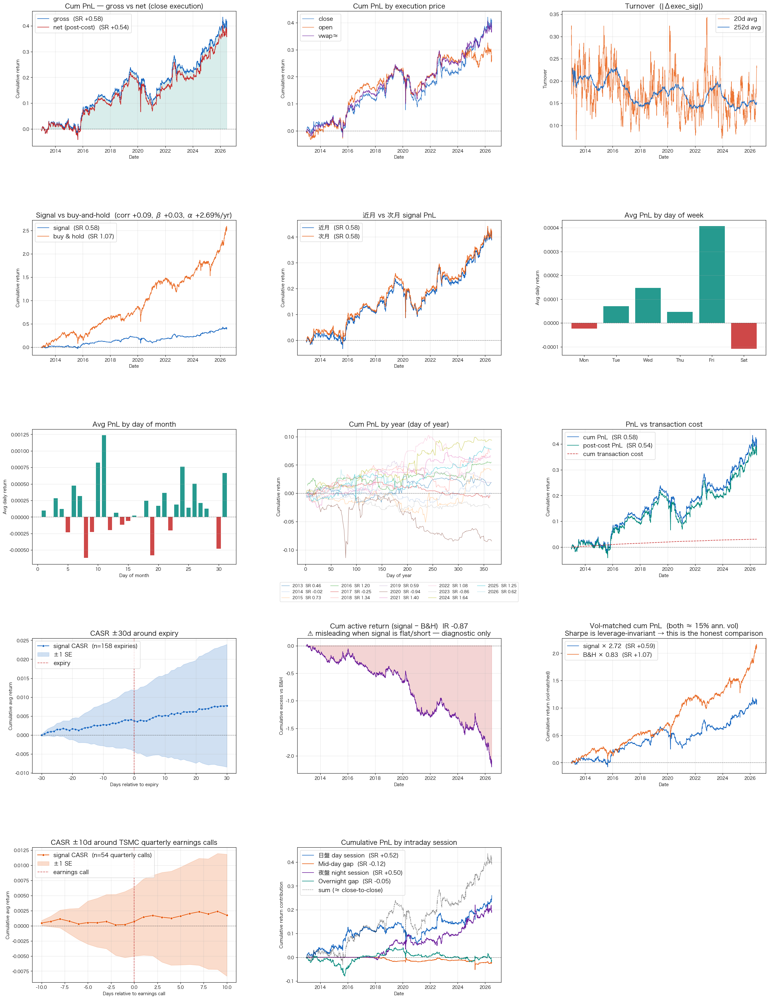

In [23]:
# ── § 16.1  Simulate each curated winner (full diagnostic dashboard) ─────

# cta.Simulate auto-plots a multi-panel dashboard as a side effect.
# Pass normalize=False because our signals are already normalized.
for key, sig in curated_signals.items():
    row = curated_tbl.loc[key]
    print("\n" + "="*90)
    print(f"  {key}    IS SR {row['SR_net']:+.2f}  |  OOS SR {row['SR_net_oos']:+.2f}  "
          f"|  β {row['beta']:+.2f}  |  α {row['alpha_ann_pct']:+.1f}%/yr  "
          f"|  SR_of_SR {row['SR_of_SR']:.2f}")
    print("="*90)
    _ = cta.Simulate(
        sig,
        asset="mtx",
        time_granularity="1d",
        normalize=False,
        start_date=IN_SAMPLE_START,
        end_date=OOS_END,
    )


## 17. TSMC event calendar — quarterly earnings + related event types

Parsing `mtx/tsmc_ea.csv` with the new `cta.load_tsmc_events()` module, we classify all 209 TSMC investor-relations rows into 4 types:

| category | count | signature | description |
|---|---|---|---|
| **`quarterly_call`** | 86 | "公布YYYY年第X季...財務報告" | **the 4x/year official 法說會 earnings announcement** — the primary event you want. Perfectly 4/year for every year 2005-2025. Time = 14:00 TPE. |
| `investor_day` | 4 | "Investor Day" | Rare TSMC-hosted capital-markets days, held in the US (Arizona / California). 2018, 2022, 2025, 2026. Major strategic announcements (roadmap, capex, gross-margin guidance). |
| `broker_conference` | 116 | "受邀參加" / "本公司將參加" | Sell-side broker/bank conference re-broadcast (UBS, Morgan Stanley, JPMorgan, Citi, CLSA, Goldman, etc.). Content is usually a repeat of the most recent quarterly call — lower expected market impact. |
| `other` | 3 | (empty description, atypical times) | Rare unclassifiable rows. |

The plot below overlays:
1. **MTX close price** (log-scale) with vertical markers for the 3 main event types
2. **Event calendar** as a scatter, one row per category, so you can visually confirm the quarterly rhythm and see when broker/investor-day events cluster


loaded 209 events → quarterly_call=86  investor_day=4  broker_conference=116  other=3

Events per year × category (2010-2026):


category,broker_conference,investor_day,other,quarterly_call
date,,,,
2010,0,0,1,4
2011,0,0,0,4
2012,7,0,0,4
2013,8,0,1,4
2014,7,0,0,4
2015,9,0,0,4
2016,4,0,0,4
2017,5,0,0,4
2018,7,1,0,4


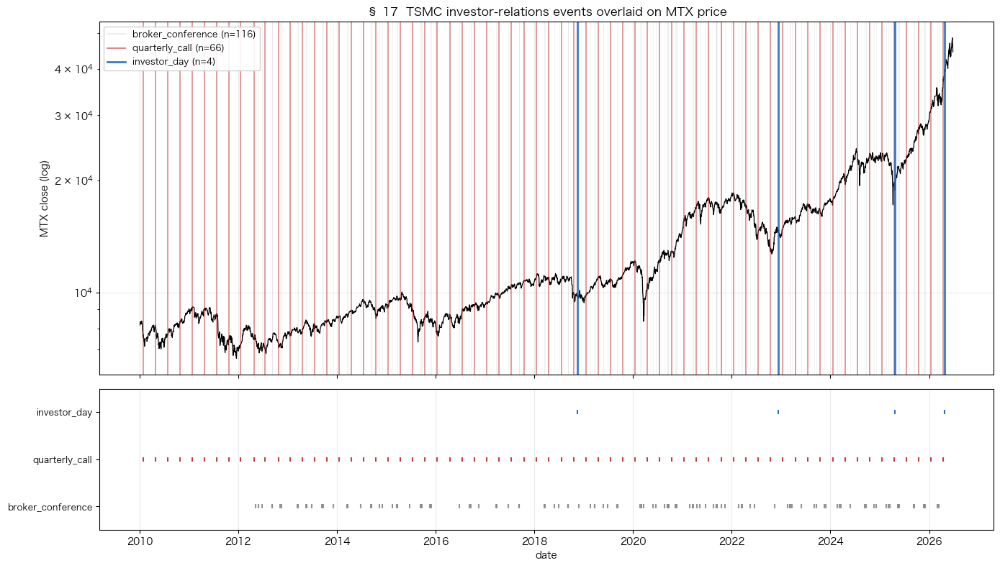

In [24]:
# ── § 17.1  TSMC event calendar overlay ───────────────────────────────────

events = cta.load_tsmc_events()
qc_dates = cta.load_tsmc_event_dates("quarterly_call",    ASSET.index)
id_dates = cta.load_tsmc_event_dates("investor_day",      ASSET.index)
bc_dates = cta.load_tsmc_event_dates("broker_conference", ASSET.index)

print(f"loaded {len(events)} events → "
      f"quarterly_call={len(qc_dates)}  investor_day={len(id_dates)}  "
      f"broker_conference={len(bc_dates)}  other={(events['category']=='other').sum()}")
print("\nEvents per year × category (2010-2026):")
display(events[events['date'].dt.year>=2010]
        .pivot_table(index=events['date'].dt.year, columns='category',
                     values='date', aggfunc='count', fill_value=0))

# ── Plot: MTX close overlay + event calendar ───────────────────────────────
fig, axes = plt.subplots(2, 1, figsize=(14, 8),
                          gridspec_kw={"height_ratios":[3,1.2]}, sharex=True)

# Panel 1: MTX log-price with event markers
close = ASSET["close"].loc["2010-01-01":]
axes[0].plot(close.index, close.values, color="black", lw=0.9)
axes[0].set_yscale("log")
axes[0].set_ylabel("MTX close (log)")
axes[0].set_title("§ 17  TSMC investor-relations events overlaid on MTX price")
ymin, ymax = axes[0].get_ylim()

def _vlines(ax, dates, color, alpha, lw, label):
    if len(dates)==0: return
    ds = [d for d in dates if d >= close.index[0]]
    for d in ds: ax.axvline(d, color=color, alpha=alpha, lw=lw)
    ax.plot([], [], color=color, alpha=alpha, lw=max(1.5,lw), label=f"{label} (n={len(ds)})")

_vlines(axes[0], bc_dates, "#888888", 0.15, 0.5, "broker_conference")
_vlines(axes[0], qc_dates, "#c62828", 0.55, 1.2, "quarterly_call")
_vlines(axes[0], id_dates, "#1565c0", 0.85, 2.0, "investor_day")
axes[0].legend(loc="upper left", fontsize=9, framealpha=0.9)
axes[0].grid(alpha=0.25)

# Panel 2: event calendar scatter, one row per category
rows = [("broker_conference", bc_dates, "#888888"),
        ("quarterly_call",    qc_dates, "#c62828"),
        ("investor_day",      id_dates, "#1565c0")]
for i, (name, dates, color) in enumerate(rows):
    dates_in = [d for d in dates if d >= close.index[0]]
    axes[1].scatter(dates_in, [i]*len(dates_in), color=color, s=18,
                    marker="|", alpha=0.9)
axes[1].set_yticks(range(len(rows)))
axes[1].set_yticklabels([r[0] for r in rows], fontsize=9)
axes[1].set_ylim(-0.5, len(rows)-0.5)
axes[1].set_xlabel("date")
axes[1].grid(alpha=0.25, axis="x")

plt.tight_layout(); plt.show()


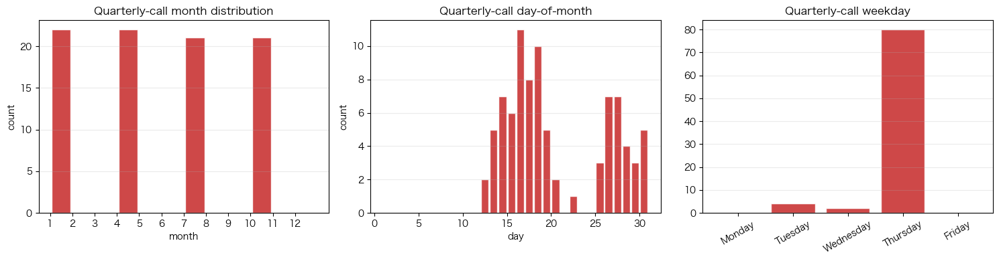


=== Quarterly-call calendar summary ===
  months used: [1, 4, 7, 10]  ← cluster in Jan/Apr/Jul/Oct
  day range  : 12–31
  weekdays   : {'Monday': 0, 'Tuesday': 4, 'Wednesday': 2, 'Thursday': 80, 'Friday': 0}


In [25]:
# ── § 17.2  Zoom: quarterly-call cadence — histogram of announcement month & day ─

qc_events = events[events["category"]=="quarterly_call"].copy()
qc_events["month"] = qc_events["date"].dt.month
qc_events["day_of_month"] = qc_events["date"].dt.day
qc_events["weekday"] = qc_events["date"].dt.day_name()

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# (a) Month
axes[0].hist(qc_events["month"], bins=range(1,14), rwidth=0.85, color="#c62828", alpha=0.85, edgecolor="white")
axes[0].set_xticks(range(1,13))
axes[0].set_title("Quarterly-call month distribution")
axes[0].set_xlabel("month"); axes[0].set_ylabel("count")
axes[0].grid(alpha=0.25, axis="y")

# (b) Day of month
axes[1].hist(qc_events["day_of_month"], bins=range(1,32), rwidth=0.85, color="#c62828", alpha=0.85, edgecolor="white")
axes[1].set_title("Quarterly-call day-of-month")
axes[1].set_xlabel("day"); axes[1].set_ylabel("count")
axes[1].grid(alpha=0.25, axis="y")

# (c) Weekday
wd_order = ["Monday","Tuesday","Wednesday","Thursday","Friday"]
wd_counts = qc_events["weekday"].value_counts().reindex(wd_order, fill_value=0)
axes[2].bar(wd_counts.index, wd_counts.values, color="#c62828", alpha=0.85, edgecolor="white")
axes[2].set_title("Quarterly-call weekday")
axes[2].tick_params(axis="x", rotation=30)
axes[2].grid(alpha=0.25, axis="y")

plt.tight_layout(); plt.show()

print("\n=== Quarterly-call calendar summary ===")
print(f"  months used: {sorted(qc_events['month'].unique().tolist())}  ← cluster in Jan/Apr/Jul/Oct")
print(f"  day range  : {qc_events['day_of_month'].min()}–{qc_events['day_of_month'].max()}")
print(f"  weekdays   : {wd_counts.to_dict()}")
